# Intelligent Data Development - Project 1
## Glovo Time Series Analysis

### by Natalia Beltrán, Clarice Mottet, Tatiana Bakwenye

0. **[Part 0: Set Up and Import](#part0)**
- **Objective**: Initialize programming environment.
- **Tasks:**
    - Library initialization
    - Import data into programming environment
    - Conduct missing data and duplication checks and correct accordingly
    - Split the data into training, validation and test.

1. **[Part 1: EDA - Order Distribution](#part1)**
- **Objective**: Evaluate behavior or initial patterns of order information
- **Tasks:**
  - Initial Statistics
  - Histogram creation

2. **[Part 2: EDA - Trends](#part2)**
- **Objective**: Evaluate if a trend occurs
- **Tasks:**
  - Create a time index based linear regression
  - Calculate rolling mean, median, std for different window and window sizes (landed on two week window and one week window size)
  - Compare the time index linear regression and rolling calcs for trend occurance

3. **[Part 3: EDA - Seasonality](#part3)**
- **Objective**: Evaluate occurance of seasonality by different periods
- **Tasks:**
  - By data level (24-hour, Day, Month):
    - Create line plot of order behavior
    - Assess periodogram of periodic behavior on the data level

4. **[Part 4: EDA - Serial Dependence](#part4)**
- **Objective**: Assess if past order behavior is indicative to future order behavior
- **Tasks:**
  - Deseason-data on the 24 and 168 hour level
  - Evaluate if there is/are cycles present
  - Create autocorrelation and partial correlation plots
  - Create lag plots on different levels and assess correlation

5. **[Part 5: Feature Creation](#part5)**
- **Objective**: Based on EDA create features to be used in predicting orders
- **Tasks:**
  - Lag features
  - Seasonality features: fourier series
  - One hot encoded features: day of week
  - Rolling window features

6. **[Part 6: Model Build and Performance](#part6)**
- **Objective**: Build multiple types of models and assess performance
- **Tasks:**
  - Model build
  - Validation prediction
  - Performance assessment

### Overview

**Part 0: Set Up and Import**
We found 18 hours - 3 days with some consecutative missing hours during the night where we had no order information. We added these hours/days into the data and filled in the order information in with a zero assuming that no orders were filled. This is a fine assumption as the time where the order information was missing were low order hours.


## <a id='part0'>Part 0: Set Up and Import</a>
- **Objective**: Initialize programming environment.
- **Tasks:**
    - Library initialization
    - Import data into programming environment
    - Conduct missing data and duplication checks and correct accordingly

- Library initialization

In [1]:
#libraries
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import numpy as np
from sklearn.metrics import mean_absolute_error
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from statsmodels.tsa.deterministic import DeterministicProcess
from scipy.signal import periodogram
from statsmodels.tsa.deterministic import Fourier
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import pacf
from xgboost import XGBRegressor
# import mlflow
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA

XSMALL_SIZE = 8
SMALL_SIZE = 12
MEDIUM_SIZE = SMALL_SIZE + 3

plt.rc('font', size=XSMALL_SIZE)           # controls default text sizes\\n\",\n",
plt.rc('axes', titlesize=XSMALL_SIZE)     # fontsize of the axes title\\n\",\n",
plt.rc('axes', labelsize=XSMALL_SIZE)    # fontsize of the x and y labels\\n\",\n",
plt.rc('xtick', labelsize=XSMALL_SIZE)    # fontsize of the tick labels\\n\",\n",
plt.rc('ytick', labelsize=XSMALL_SIZE)    # fontsize of the tick labels\\n\",\n",
plt.rc('legend', fontsize=XSMALL_SIZE)    # legend fontsize\\n\",\n",
plt.rc('figure', titlesize=XSMALL_SIZE)  # fontsize of the figure title\\n\",\n",
plt.rc('figure', figsize=(7, 2))
plt.rc('figure', dpi=200)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)

#paths
path_in_ = r'/home/clarice/Documents/VSCode/Term3/Intelligent_Data/IDD_glovo_time_series/inputs/'
path_out_ = r'/home/clarice/Documents/VSCode/Term3/Intelligent_Data/IDD_glovo_time_series/outputs/'

#global variables
TARGET = 'orders'

/home/clarice/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


- Import data into programming environment

In [12]:
#import data into python

df_orders = pd.read_csv(path_in_ + 'data_BCN.csv', dtype = str)
df_orders['time'] = pd.to_datetime(df_orders['time'])
df_orders['orders'] = pd.to_numeric(df_orders['orders'])

df_orders.sort_values(by = ['time'], inplace = True)
df_orders.reset_index(drop = True, inplace = True)

In [46]:
df_orders.head()

,time,orders,city
0,2021-02-01 00:00:00,0.0,BCN
1,2021-02-01 01:00:00,0.0,BCN
2,2021-02-01 02:00:00,0.0,BCN
3,2021-02-01 03:00:00,0.0,BCN
4,2021-02-01 04:00:00,0.0,BCN


- Conduct missing data and duplication checks and correct accordingly

    - Start time of data is 2021-02-01, end time is 2022-02-01.
    - Data is given on an hourly basis.
    - There are no rows with null orders
    - There are 18 hours unaccounted for. These occur for 6 hour intervals in the middle of the night for 3 days. These hours are added to the data and orders filled in with zero.
    - There are always exactly 24 hours that occur within a day (data is not affected by day light savings).

In [47]:
#basic stats - time

df_orders[['time']].describe().T

,count,mean,min,25%,50%,75%,max
time,8766,2021-08-03 01:57:28.459958784,2021-02-01 00:00:00,2021-05-03 13:15:00,2021-08-03 02:30:00,2021-11-02 15:45:00,2022-02-01 23:00:00


In [13]:
#data checks - null, duplicates, missing?

#are there any orders with null information?
print("number of null orders:",df_orders['orders'].isna().sum())

#do we have duplicate order information?
df_view = df_orders.copy()
df_view.drop_duplicates(subset = ['time'], inplace = True)
print("import row count:", len(df_orders['time']))
print("post dup rmv row count:", len(df_view['time']))
del df_view

#are we missing any minute by minute order information?
start_time = pd.to_datetime('2021-02-01')
end_time = pd.to_datetime('2022-02-02')
date_range = pd.date_range(start=start_time, end=end_time, freq='h')
df_all = pd.DataFrame(date_range, columns=['time_all'])
df_all = df_all[df_all['time_all']<end_time]

df_all = df_all.merge(df_orders[['time']], how = 'left', left_on = ['time_all'], right_on = ['time'])
print("number of hours missing:",df_all['time'].isna().sum())
df_all_msng = df_all[df_all['time'].isna()].copy()
print("hours missing order information:")
print(df_all_msng)


number of null orders: 0
import row count: 8766
post dup rmv row count: 8766
number of hours missing: 18
hours missing order information:
                time_all time
336  2021-02-15 00:00:00  NaT
337  2021-02-15 01:00:00  NaT
338  2021-02-15 02:00:00  NaT
339  2021-02-15 03:00:00  NaT
340  2021-02-15 04:00:00  NaT
341  2021-02-15 05:00:00  NaT
3024 2021-06-07 00:00:00  NaT
3025 2021-06-07 01:00:00  NaT
3026 2021-06-07 02:00:00  NaT
3027 2021-06-07 03:00:00  NaT
3028 2021-06-07 04:00:00  NaT
3029 2021-06-07 05:00:00  NaT
6216 2021-10-18 00:00:00  NaT
6217 2021-10-18 01:00:00  NaT
6218 2021-10-18 02:00:00  NaT
6219 2021-10-18 03:00:00  NaT
6220 2021-10-18 04:00:00  NaT
6221 2021-10-18 05:00:00  NaT


In [14]:
#add in the hours that the orders data frame is currently missing

#add in the missing hours
df_orders = df_all[['time_all']].merge(df_orders, how = 'left', left_on = ['time_all'], right_on = ['time'])
df_orders.sort_values(by = ['time_all'], inplace = True)

#set missing hour order count to zero
df_orders.loc[df_orders['orders'].isna(), 'orders'] = 0

print("number of nulls",df_orders['orders'].isna().sum())

df_orders_msng = df_orders[df_orders['time'].isna()].copy()
print(df_orders_msng)

df_orders.loc[df_orders['time'].isna(), 'time'] = df_orders['time_all']
df_orders.sort_values(by = ['time_all'], inplace = True)
df_orders.reset_index(drop = True, inplace = True)
df_orders = df_orders[['time', 'orders', 'city']]

number of nulls 0
                time_all time  orders city
336  2021-02-15 00:00:00  NaT     0.0  NaN
337  2021-02-15 01:00:00  NaT     0.0  NaN
338  2021-02-15 02:00:00  NaT     0.0  NaN
339  2021-02-15 03:00:00  NaT     0.0  NaN
340  2021-02-15 04:00:00  NaT     0.0  NaN
341  2021-02-15 05:00:00  NaT     0.0  NaN
3024 2021-06-07 00:00:00  NaT     0.0  NaN
3025 2021-06-07 01:00:00  NaT     0.0  NaN
3026 2021-06-07 02:00:00  NaT     0.0  NaN
3027 2021-06-07 03:00:00  NaT     0.0  NaN
3028 2021-06-07 04:00:00  NaT     0.0  NaN
3029 2021-06-07 05:00:00  NaT     0.0  NaN
6216 2021-10-18 00:00:00  NaT     0.0  NaN
6217 2021-10-18 01:00:00  NaT     0.0  NaN
6218 2021-10-18 02:00:00  NaT     0.0  NaN
6219 2021-10-18 03:00:00  NaT     0.0  NaN
6220 2021-10-18 04:00:00  NaT     0.0  NaN
6221 2021-10-18 05:00:00  NaT     0.0  NaN


In [15]:
#Check to make sure that all days have exactly 24 hours

df_orders['year'] = df_orders['time'].dt.year
df_orders['month'] = df_orders['time'].dt.month
df_orders['day'] = df_orders['time'].dt.day
df_orders['hour'] = df_orders['time'].dt.hour
df_orders['date'] = pd.to_datetime(df_orders[['year','month','day']])

df_check = df_orders.copy()
df_check['count_by_day'] = 1
df_check['count_by_day'] = df_check.groupby(by = ['date'])['count_by_day'].transform('sum')
df_check.drop_duplicates(subset = ['date'], inplace = True)
df_check.sort_values(by = ['count_by_day'], inplace = True)
print('minimum number of hours in day:'+str(df_check[['count_by_day']].head(1)))
print('maximum number of hours in day:'+str(df_check[['count_by_day']].tail(1)))

minimum number of hours in day:   count_by_day
0            24
maximum number of hours in day:      count_by_day
8760            24


In [16]:
#Create out features from time field (hour, day, month, year)

df_orders['year'] = df_orders['time'].dt.year
df_orders['month'] = df_orders['time'].dt.month
df_orders['day'] = df_orders['time'].dt.day
df_orders['hour'] = df_orders['time'].dt.hour
df_orders['date'] = pd.to_datetime(df_orders[['year','month','day']])
df_orders['dayofweek'] = df_orders['time'].dt.day_of_week
df_orders['dayofyear'] = df_orders['time'].dt.day_of_year

df_orders.sort_values(by = ['time'], inplace = True)
df_orders.reset_index(drop = True, inplace = True)

#Add one to all orders and then take log
df_orders['orders_log'] = df_orders['orders'] + 1
df_orders['orders_log'] = np.log(df_orders['orders_log'])

- Split the data into training, validation and test.
    - Training time frame is 2021-02-01 to 2022-01-09
    - Validation time frame is 2022-01-10 to 2022-01-23 (two weeks M-F)
    - Test time frame is 2022-01-24 to 2022-01-30 (one week M-F)

In [17]:
#Split data into train, validation, test

#Split the data into test, validation and orders

#test is the last week of January
#1/24/2022--1/30/2022 (Mon--Sun)
df_test = df_orders[df_orders['time']>=pd.to_datetime('2022-01-24 00:00:00')].copy()
df_test = df_test[df_test['time']<=pd.to_datetime('2022-01-30 23:00:00')]

#validation is the second and third week of January
#W1: 1/10/2022--1/16/2022 (Mon--Sun)
#W2: 1/17/2022--1/23/2022 (Mon--Sun)
df_val = df_orders[df_orders['time']>=pd.to_datetime('2022-01-10 00:00:00')].copy()
df_val = df_val[df_val['time']<=pd.to_datetime('2022-01-23 23:00:00')]
#created week_ind that specifies the dataset two weeks
df_val['week_ind'] = 1
df_val.loc[(df_val['time']>=pd.to_datetime('2022-01-17 00:00:00')), 'week_ind'] = 2

#the data for training is all other dates
df_orders = df_orders[df_orders['time']<=pd.to_datetime('2022-01-09 23:00:00')]

df_orders.sort_values(by = ['time'], inplace = True)
df_orders.reset_index(drop = True, inplace = True)

df_orders['time_index'] = 1
df_orders['time_index'] = df_orders['time_index'].cumsum()

## <a id='part1'>Part 1: EDA - Order Distribution</a>
- **Objective**: Evaluate behavior or initial patterns of order information
- **Tasks:**
  - Initial Statistics
  - Histogram creation
    - Orders
    - Log of (Orders + 1)

- **Overview**:
  - Orders
    - The median is approx 30 and the mean is approx 73 so the data is extremely right skewed.
    - When hour blocks with zero orders are removed the median is 61 and the mean is 107.08 so still very right skewed.
  - Log of (Orders + 1)
    - Using all data the mean is around 2.7 and the median is around 3.4 so we're seeing seeing the data is skewed. Yet when we look at the historgram we see a normal distribution of orders when not accounting for hours where the number of orders is 1.
    -  Removing the hours where the log orders is zero we have that the mean and median are very close (around 4). Looking at the histogram with zeros removed, we still see that the data is skewed though not as drastically. We will see if using the Log of (Orders + 1) as our target yeilds better model performance than Orders as it.


- Initial Statistics and Histogram: All data

We're seeing a large number of hours where there are no orders made and the difference between the mean and median is quite large, data is extremely skewed.

In [56]:
#general statistics

df_orders[['orders']].describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
orders,8232.0,71.81,109.15,0.0,0.0,29.0,94.0,939.0


array([[<Axes: title={'center': 'orders'}>]], dtype=object)

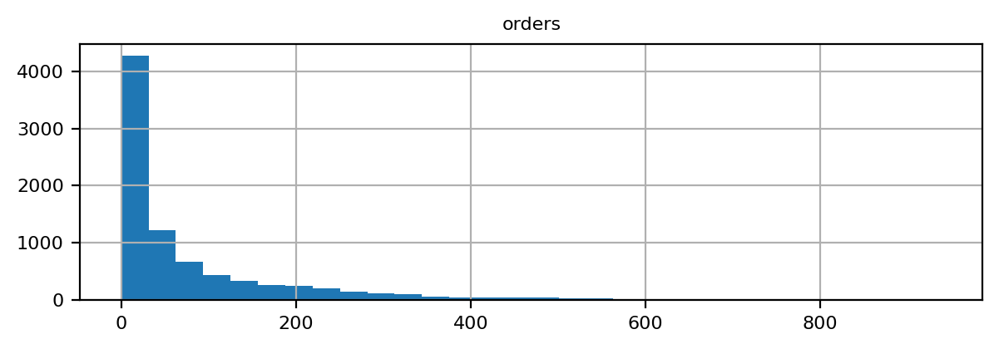

In [57]:
df_orders[['orders']].hist(bins=30)

- Initial Statistics and Histogram: Data with zero orders removed

We remove orders that are equal to zero to evaluate if the "skewed-ness" is related to these and find that there is still a significant difference between the mean and median and the data is still very skewed.

In [58]:
df_view = df_orders[df_orders['orders']>0]
df_view[['orders']].describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
orders,5612.0,105.34,118.08,0.7,28.0,60.0,149.0,939.0


array([[<Axes: title={'center': 'orders'}>]], dtype=object)

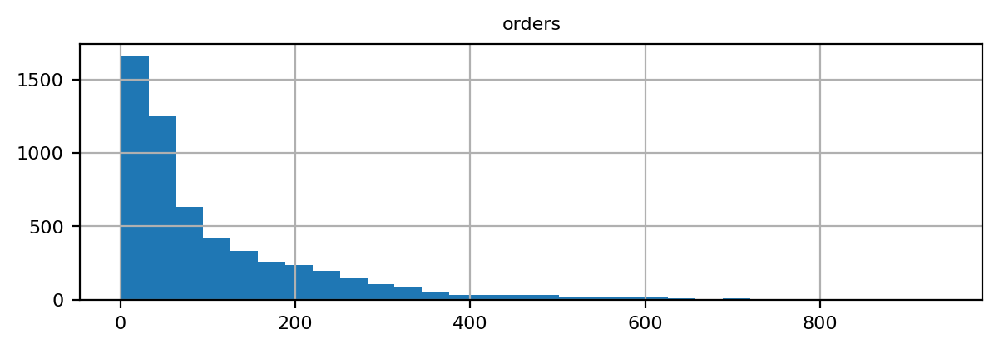

In [60]:
df_view[['orders']].hist(bins=30)

- Initial Statistics and Histogram: All Data - Log Target

Taking the log of (orders + 1) we and calculating initial statistics, we see that the data is skewed.

In [61]:
#intial statistics 

df_orders[['orders_log']].describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
orders_log,8232.0,2.72,2.17,0.0,0.0,3.4,4.55,6.85


array([[<Axes: title={'center': 'orders_log'}>]], dtype=object)

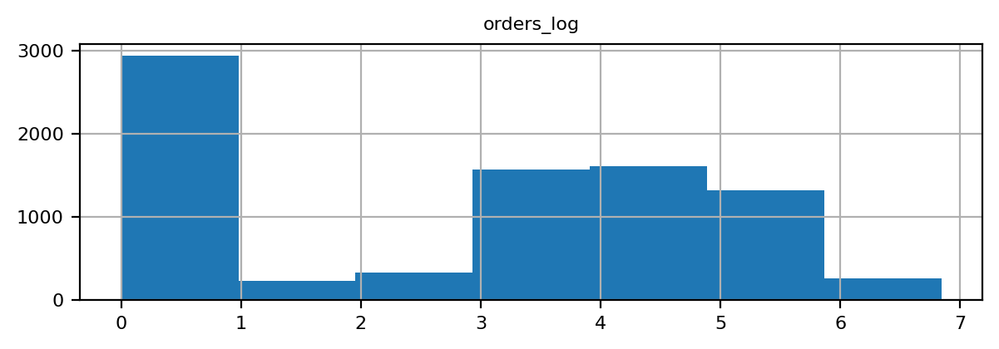

In [62]:
df_orders[['orders_log']].hist(bins=7)

- Initial Statistics and Histogram: Data with zero orders removed - Log Target

Removing zeros, we see that the mean and the median are much closer in value indicating that first creating a classification problem of whether there are orders and then a prediction of number of orders could be a good model process. We still do see that the log of target is slightly skewed though.

In [63]:
df_view = df_orders[df_orders['orders_log']>0]
df_view[['orders_log']].describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
orders_log,5612.0,3.99,1.36,0.53,3.37,4.11,5.01,6.85


array([[<Axes: title={'center': 'orders_log'}>]], dtype=object)

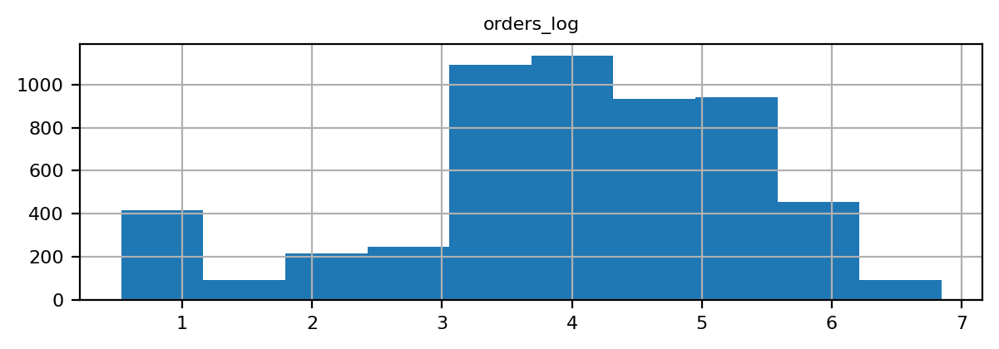

In [64]:
df_view[['orders_log']].hist(bins=10)

## <a id='part2'>Part 2: EDA - Trends</a>
- **Objective**: Evaluate if a trend occurs
- **Tasks:**
  - Create a time index based linear regression
  - Calculate rolling mean, median, std for different window and window sizes (landed on two week window and one week window size)
  - Compare the time index linear regression and rolling calcs for trend occurance
- **Overview**:
  - Orders: Taken with a grain of salt that the data is very skewed so evaluate trend based on the mean can lead to a skewed trend interpretation, the rate of change for the time index LR was .0035 (not a very compelling indication of a trend). When compared against the rolling median, we similarly saw little evidence that would indicate a trend.
  - Log (Orders + 1): We still don't see a very strong trend of increases in orders over the training time period.

  - Create a time index based linear regression: Orders

In [117]:
#LR - time index - orders

X = df_orders[['time_index','time']]
X.set_index('time',inplace = True)
y = df_orders[['orders']]  # the target

print("no intercept")
model = LinearRegression(fit_intercept = False)
model.fit(X, y)

print(model.coef_)
print(model.intercept_)

print("with intercept")
model = LinearRegression()
model.fit(X, y)

#possible there is a slight trend .3%?
print(model.coef_)
print(model.intercept_)

y_pred = pd.Series(model.predict(X).flatten(), index=X.index)

no intercept
[[0.0140483]]
0.0
with intercept
[[0.00385393]]
[55.95013663]


  - Calculate rolling mean, median, std for different window and window sizes: Orders


In [116]:
#rolling window

df_orders_time = df_orders.set_index('time')
rolling_window = df_orders_time[['orders']].rolling(
    window=336,       # two weeks
    center=False,       
    min_periods=168,   # 168 = 24*7 (one week)
)

moving_median = rolling_window.median()  # Compute the median
moving_mean = rolling_window.mean()      # Compute the mean
moving_std = rolling_window.std()      # Compute the mean

  - Compare the time index linear regression and rolling calcs for trend occurance: Orders

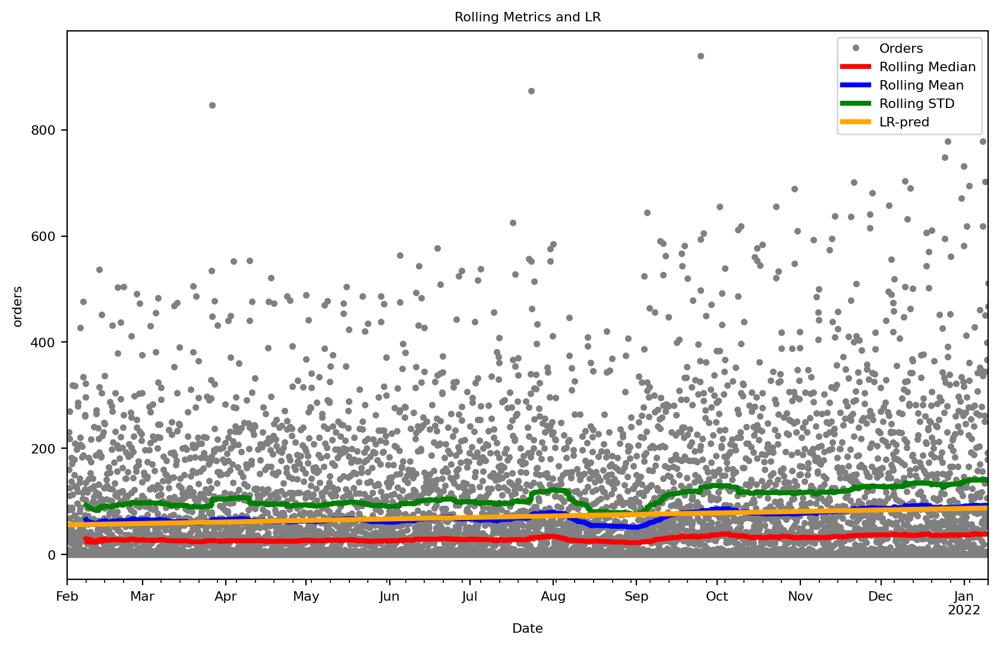

In [118]:
# Plotting

ax = df_orders_time[['orders']].plot(style=".", color="0.5", figsize=(10, 6))
moving_median.plot(ax=ax, linewidth=3, color='red', legend=True)
moving_mean.plot(ax=ax, linewidth=3, color='blue', legend=True)
moving_std.plot(ax=ax, linewidth=3, color='green', legend=True)
y_pred.plot(ax=ax, linewidth=3, color='orange', legend=True)
ax.legend(["Orders", "Rolling Median", "Rolling Mean", "Rolling STD", "LR-pred"])
ax.set_title("Rolling Metrics and LR")
ax.set_xlabel("Date")  # Assuming the index of df_orders_time is some datetime type
ax.set_ylabel('orders')

plt.show()

- Create a time index based linear regression: Log Orders

In [90]:
#LR - time index - log orders

X = df_orders[['time_index','time']]
X.set_index('time',inplace = True)
y = df_orders[['orders_log']]  # the target

print("no intercept")
model = LinearRegression(fit_intercept = False)
model.fit(X, y)

print(model.coef_)
print(model.intercept_)

print("with intercept")
model = LinearRegression()
model.fit(X, y)

print(model.coef_)
print(model.intercept_)

y_pred = pd.Series(model.predict(X).flatten(), index=X.index)

no intercept
[[0.00050411]]
0.0
with intercept
[[3.35607145e-05]]
[2.58251613]


- Calculate rolling mean, median, std for different window and window sizes: Log Orders

In [91]:
#rolling window

df_orders_time = df_orders.set_index('time')
rolling_window = df_orders_time[['orders_log']].rolling(
    window=336,       # two weeks
    center=False,       
    min_periods=168,   # 168 = 24*7 (one week)
)

moving_median = rolling_window.median()  # Compute the median
moving_mean = rolling_window.mean()      # Compute the mean
moving_std = rolling_window.std()      # Compute the mean

- Compare the time index linear regression and rolling calcs for trend occurance: Log Orders

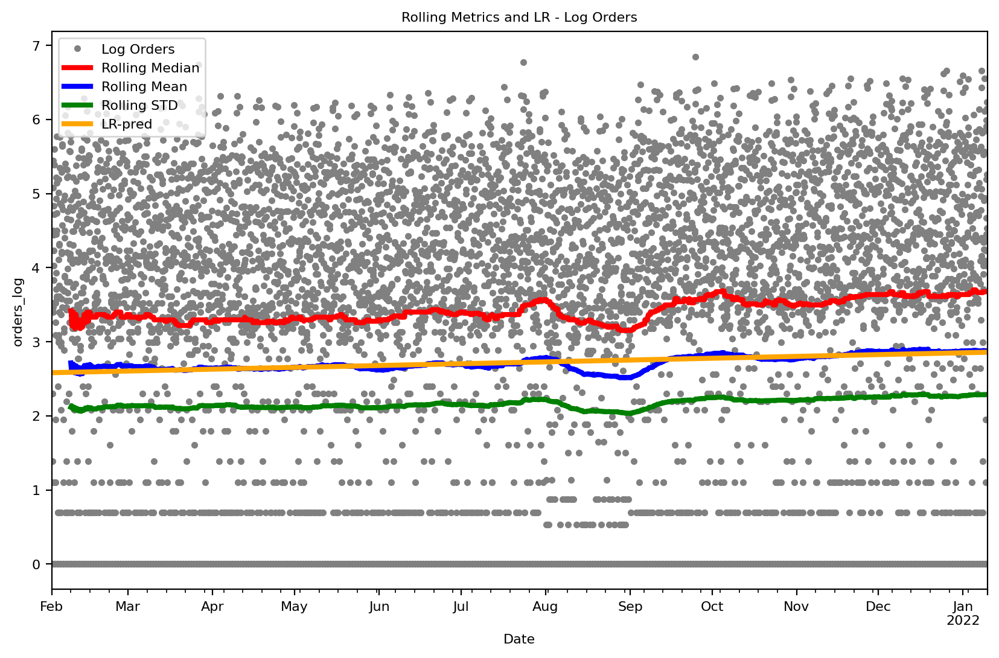

In [92]:
# Plotting

ax = df_orders_time[['orders_log']].plot(style=".", color="0.5", figsize=(10, 6))
moving_median.plot(ax=ax, linewidth=3, color='red', legend=True)
moving_mean.plot(ax=ax, linewidth=3, color='blue', legend=True)
moving_std.plot(ax=ax, linewidth=3, color='green', legend=True)
y_pred.plot(ax=ax, linewidth=3, color='orange', legend=True)
ax.legend(["Log Orders", "Rolling Median", "Rolling Mean", "Rolling STD", "LR-pred"])
ax.set_title("Rolling Metrics and LR - Log Orders")
ax.set_xlabel("Date")  # Assuming the index of df_orders_time is some datetime type
ax.set_ylabel('orders_log')

plt.show()

## <a id='part3'>Part 3: EDA - Seasonality</a>
- **Objective**: Evaluate occurance of seasonality by different periods
- **Tasks:**
  - By data level (Hour, Day, Month):
    - Create line plot of order behavior
    - Assess periodogram of periodic behavior on the data level
- **Overview:**
  - We saw strong recurrent seasonality behavior by hour of day on the day level.
  - There was strong recurrent seasonality behavior by day of week on the week level.
  - There was not recurrent seasonality behavior on the day of the month of the month of year level.

- Hour of Day:

From the line plot and the periodogram, we see strong indication of recurrent seasonal behavior on the 24-hour period and day of week within a week level.

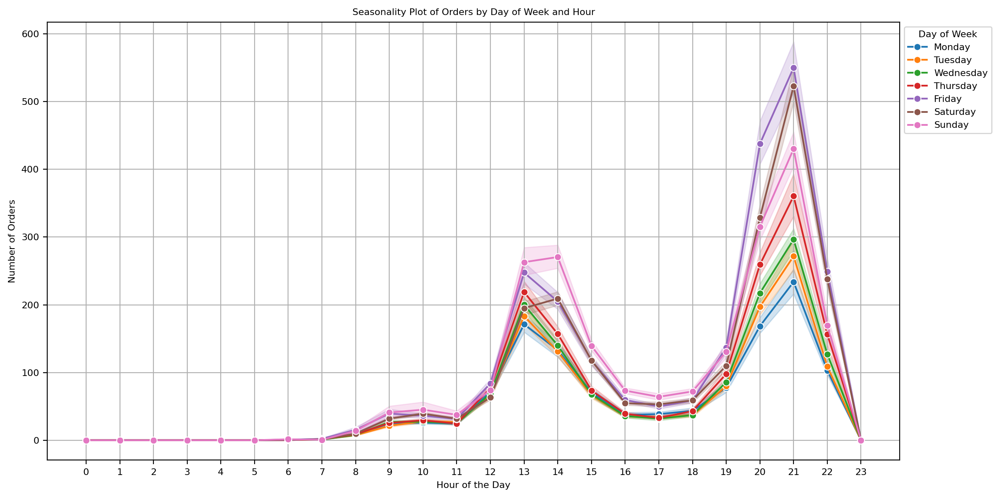

In [93]:
#line plot - hour level by day of week

# Extract day of week and hour from the 'time' column
df_orders['dayofweek'] = df_orders['time'].dt.day_name()
df_orders['hour'] = df_orders['time'].dt.hour

# Create a seasonal plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_orders, x='hour', y='orders', hue='dayofweek', marker='o')

plt.title('Seasonality Plot of Orders by Day of Week and Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Orders')
plt.grid(True)
plt.xticks(range(24))  # Set x-axis ticks to show every hour
plt.legend(title='Day of Week', loc='upper left', bbox_to_anchor=(1, 1))  # Move legend outside the plot
plt.tight_layout()
plt.show()


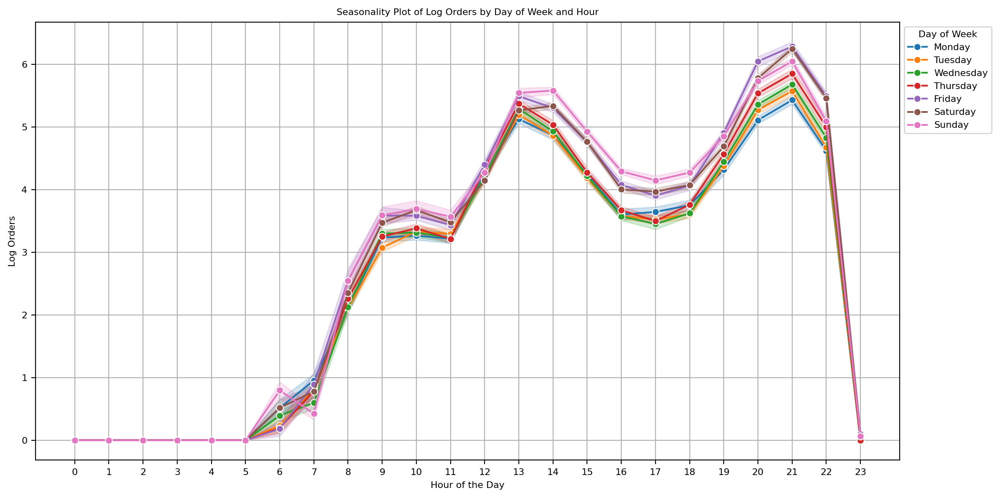

In [94]:
#line plot - hour level by day of week: Log orders

# Extract day of week and hour from the 'time' column
df_orders['dayofweek'] = df_orders['time'].dt.day_name()
df_orders['hour'] = df_orders['time'].dt.hour

# Create a seasonal plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_orders, x='hour', y='orders_log', hue='dayofweek', marker='o')

plt.title('Seasonality Plot of Log Orders by Day of Week and Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Log Orders')
plt.grid(True)
plt.xticks(range(24))  # Set x-axis ticks to show every hour
plt.legend(title='Day of Week', loc='upper left', bbox_to_anchor=(1, 1))  # Move legend outside the plot
plt.tight_layout()
plt.show()

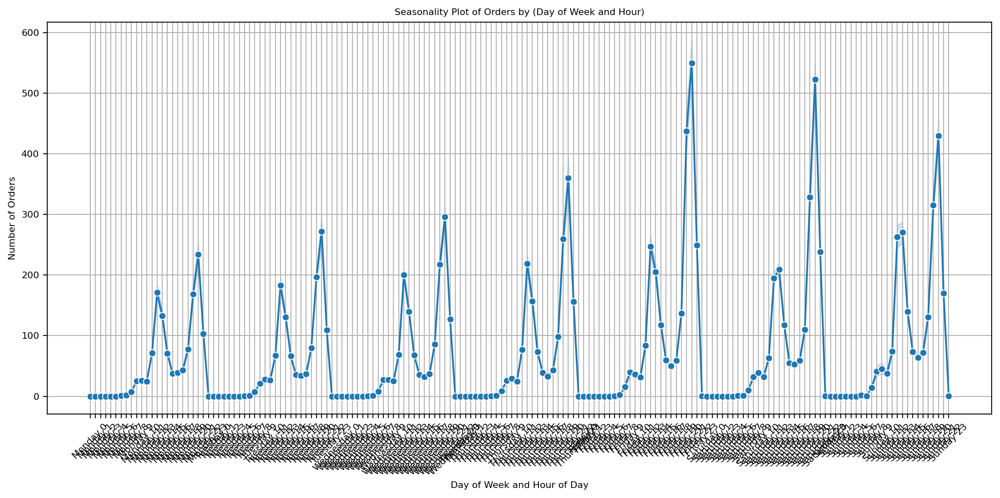

In [95]:
#single line plot - hour of day and day of week

# Extract day of week and hour from the 'time' column
df_orders['dayofweek'] = df_orders['time'].dt.day_name()
df_orders['hour'] = df_orders['time'].dt.hour

# Create a new column combining day of week and hour
df_orders['day_hour'] = df_orders['dayofweek'] + ' ' + df_orders['hour'].astype(str)

# Create a seasonal plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_orders, x='day_hour', y='orders', marker='o')

plt.title('Seasonality Plot of Orders by (Day of Week and Hour)')
plt.xlabel('Day of Week and Hour of Day')
plt.ylabel('Number of Orders')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()


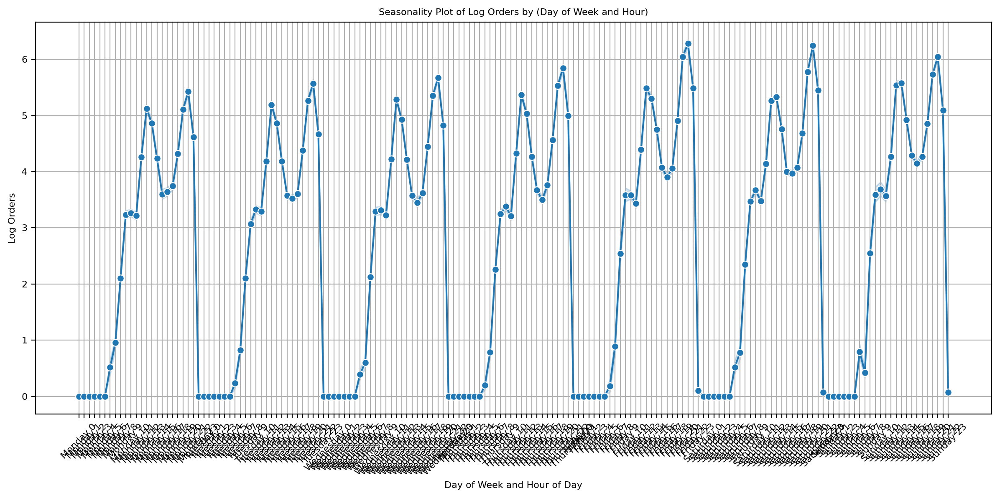

In [98]:
#single line plot - hour of day and day of week

# Extract day of week and hour from the 'time' column
df_orders['dayofweek'] = df_orders['time'].dt.day_name()
df_orders['hour'] = df_orders['time'].dt.hour

# Create a new column combining day of week and hour
df_orders['day_hour'] = df_orders['dayofweek'] + ' ' + df_orders['hour'].astype(str)

# Create a seasonal plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_orders, x='day_hour', y='orders_log', marker='o')

plt.title('Seasonality Plot of Log Orders by (Day of Week and Hour)')
plt.xlabel('Day of Week and Hour of Day')
plt.ylabel('Log Orders')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()


/tmp/ipykernel_33415/4111022713.py:9: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hourly_orders = df_period.resample('H').sum()


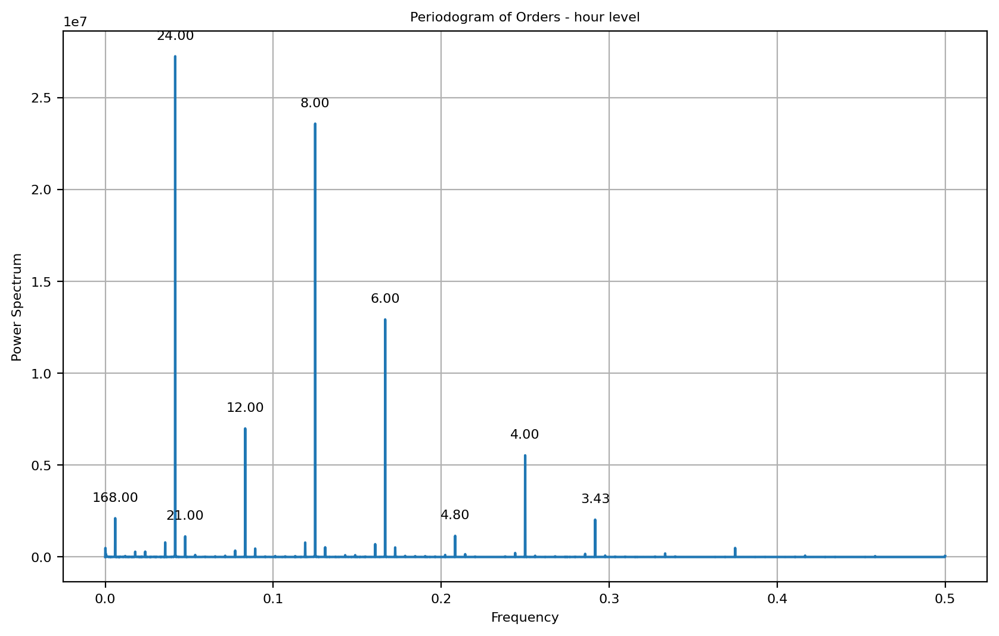

In [99]:
#periodogram: 24 hour level

df_period = df_orders[['time','orders']].copy()

# Set 'time' column as index
df_period.set_index('time', inplace=True)

# Resample data to get hourly counts
hourly_orders = df_period.resample('H').sum()

# Compute periodogram
frequencies, power_spectrum = periodogram(hourly_orders['orders'])

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(frequencies, power_spectrum)
plt.title('Periodogram of Orders - hour level')
plt.xlabel('Frequency')
plt.ylabel('Power Spectrum')
plt.grid(True)

# Annotate points where power spectrum > 0.2
for freq, power in zip(frequencies, power_spectrum):
    if power > 0.1*(1e7):
        freq_ = 1/freq
        plt.annotate(f'{freq_:.2f}', (freq, power), textcoords="offset points", xytext=(0,10), ha='center')

plt.show()


/tmp/ipykernel_33415/60993589.py:7: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hourly_orders = df_period.resample('H').sum()


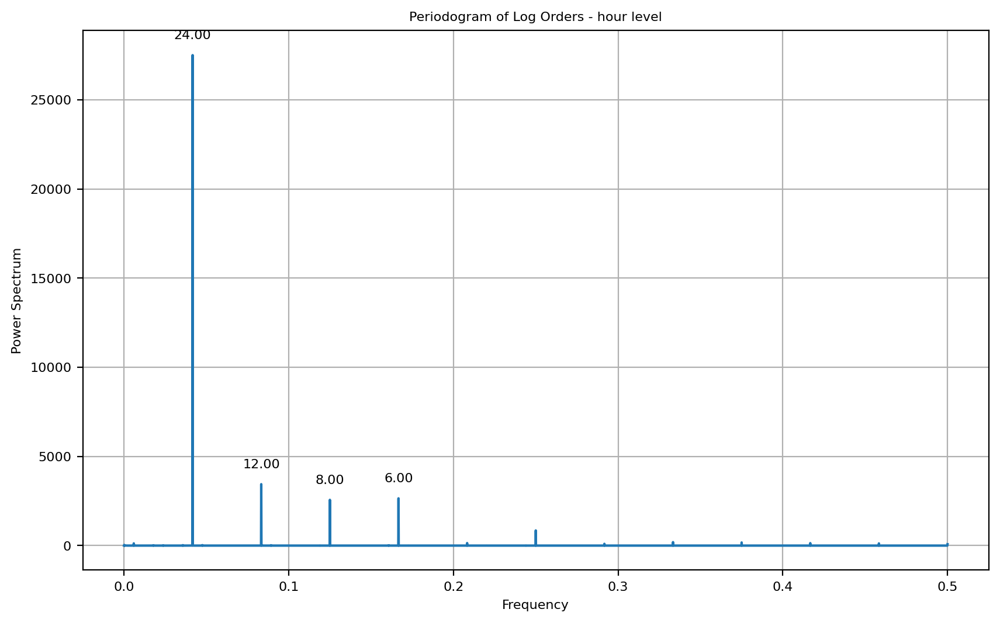

In [101]:
df_period = df_orders[['time','orders_log']].copy()

# Set 'time' column as index
df_period.set_index('time', inplace=True)

# Resample data to get hourly counts
hourly_orders = df_period.resample('H').sum()

# Compute periodogram
frequencies, power_spectrum = periodogram(hourly_orders['orders_log'])

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(frequencies, power_spectrum)
plt.title('Periodogram of Log Orders - hour level')
plt.xlabel('Frequency')
plt.ylabel('Power Spectrum')
plt.grid(True)

# Annotate points where power spectrum > 0.2
for freq, power in zip(frequencies, power_spectrum):
    if power > 1000:
        freq_ = 1/freq
        plt.annotate(f'{freq_:.2f}', (freq, power), textcoords="offset points", xytext=(0,10), ha='center')

plt.show()


- Day of Month

There does not appear to be consistent seasonal behavior on the day within the month level. From the periodogram, we see further indication that there is strong seasonal behavior week to week.

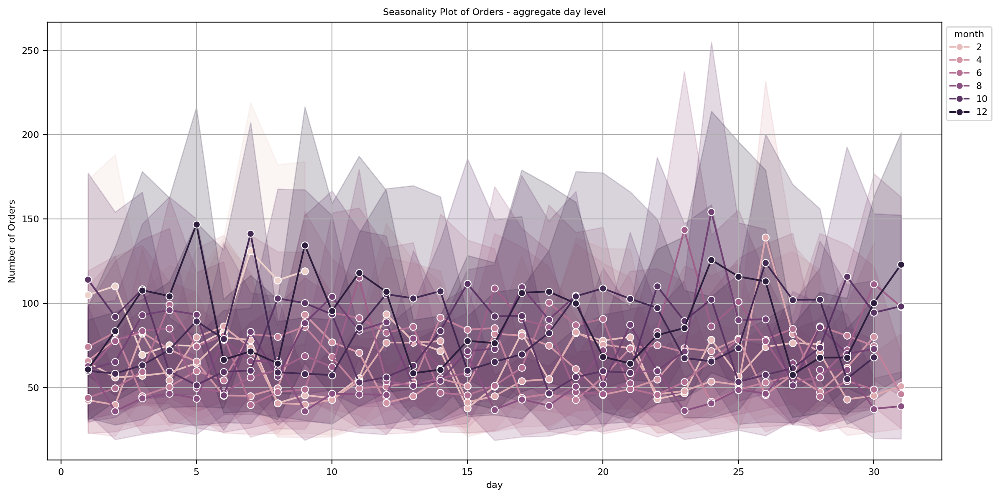

In [102]:
#line plot - day of month by month

df_period = df_orders.copy()
df_period['orders'] = df_period.groupby(by = ['date'])['orders'].transform('sum')
df_period.sort_values(by = ['date'], inplace = True)
df_period.drop_duplicates(subset = ['date'], inplace = True)

# Create a seasonal plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_orders, x='day', y='orders',hue = 'month', marker='o')

plt.title('Seasonality Plot of Orders - aggregate day level')
plt.xlabel('day')
plt.ylabel('Number of Orders')
plt.grid(True)
# plt.xticks(range())  # Set x-axis ticks to show every hour
plt.legend(title='month', loc='upper left', bbox_to_anchor=(1, 1))  # Move legend outside the plot
plt.tight_layout()
plt.show()

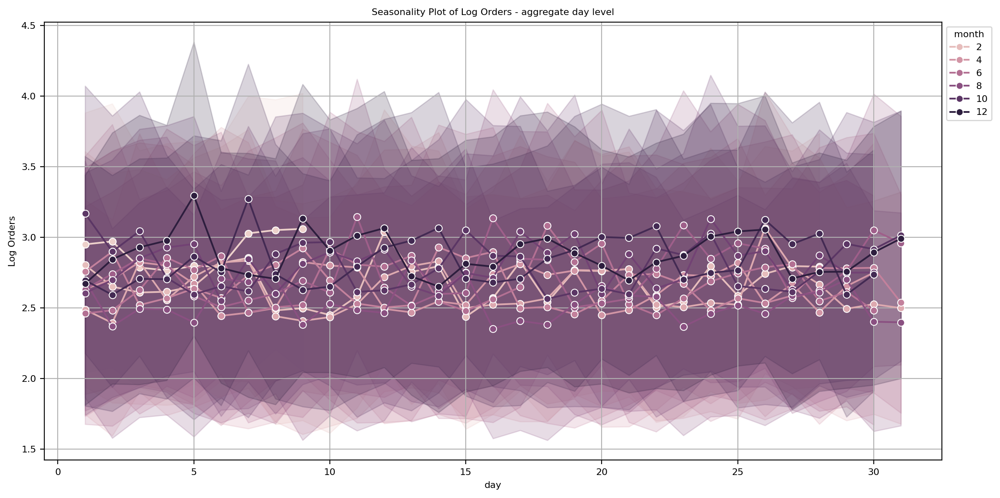

In [103]:
df_period = df_orders.copy()
df_period['orders_log'] = df_period.groupby(by = ['date'])['orders_log'].transform('sum')
df_period.sort_values(by = ['date'], inplace = True)
df_period.drop_duplicates(subset = ['date'], inplace = True)

# Create a seasonal plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_orders, x='day', y='orders_log',hue = 'month', marker='o')

plt.title('Seasonality Plot of Log Orders - aggregate day level')
plt.xlabel('day')
plt.ylabel('Log Orders')
plt.grid(True)
# plt.xticks(range())  # Set x-axis ticks to show every hour
plt.legend(title='month', loc='upper left', bbox_to_anchor=(1, 1))  # Move legend outside the plot
plt.tight_layout()
plt.show()

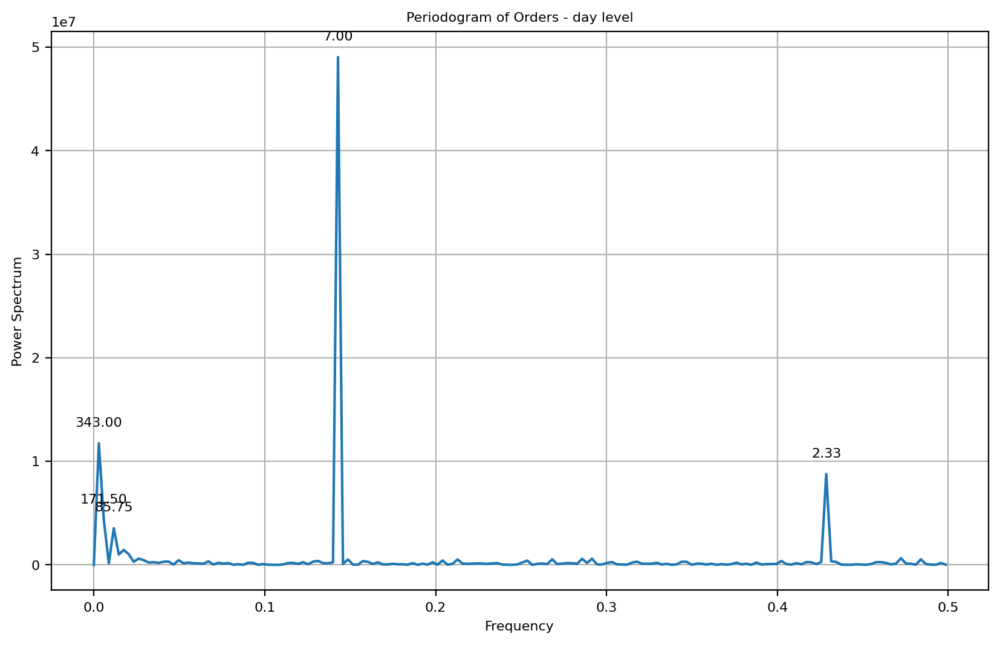

In [104]:
#periodogram: day within year

df_period = df_orders[['date','orders']].copy()
df_period['orders'] = df_period.groupby(by = ['date'])['orders'].transform('sum')
df_period = df_period[['date','orders']].drop_duplicates()

# Set 'time' column as index
df_period.set_index('date', inplace=True)

# Resample data to get hourly counts
hourly_orders = df_period.resample('D').sum()

# Compute periodogram
frequencies, power_spectrum = periodogram(hourly_orders['orders'])

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(frequencies, power_spectrum)
plt.title('Periodogram of Orders - day level')
plt.xlabel('Frequency')
plt.ylabel('Power Spectrum')
plt.grid(True)

# Annotate points where power spectrum > 0.2
for freq, power in zip(frequencies, power_spectrum):
    if power > 0.25*(1e7):
        freq_ = 1/freq
        plt.annotate(f'{freq_:.2f}', (freq, power), textcoords="offset points", xytext=(0,10), ha='center')

plt.show()


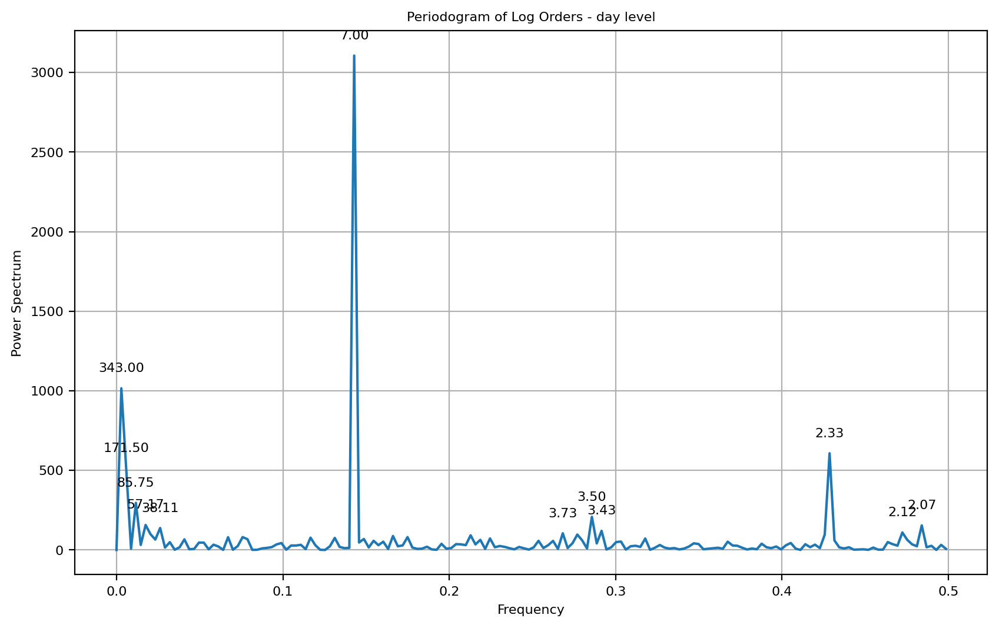

In [106]:
#periodogram: day within year

df_period = df_orders[['date','orders_log']].copy()
df_period['orders'] = df_period.groupby(by = ['date'])['orders_log'].transform('sum')
df_period = df_period[['date','orders_log']].drop_duplicates()

# Set 'time' column as index
df_period.set_index('date', inplace=True)

# Resample data to get hourly counts
hourly_orders = df_period.resample('D').sum()

# Compute periodogram
frequencies, power_spectrum = periodogram(hourly_orders['orders_log'])

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(frequencies, power_spectrum)
plt.title('Periodogram of Log Orders - day level')
plt.xlabel('Frequency')
plt.ylabel('Power Spectrum')
plt.grid(True)

# Annotate points where power spectrum > 0.2
for freq, power in zip(frequencies, power_spectrum):
    if power > 100:
        freq_ = 1/freq
        plt.annotate(f'{freq_:.2f}', (freq, power), textcoords="offset points", xytext=(0,10), ha='center')

plt.show()

- Month of Year:

Unsure if we can really attribute behavior as seasonal or to the month of august. There is a strong decrease and then increase after the month of august. Unsure if this is consistent year to year or an outlier. Because we only have data for each month, we don't derive much insight from the periodogram.

/tmp/ipykernel_94854/2695093799.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='aggregate month', loc='upper left', bbox_to_anchor=(1, 1))  # Move legend outside the plot


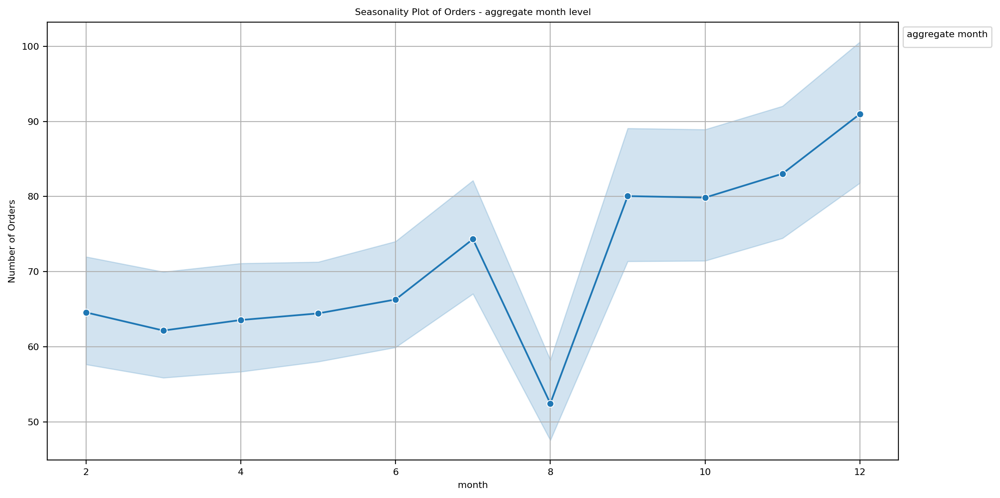

In [25]:
#line plot - month of year

df_period = df_orders.copy()
df_period['orders'] = df_period.groupby(by = ['month'])['orders'].transform('sum')
df_period.sort_values(by = ['date'], inplace = True)
df_period.drop_duplicates(subset = ['month'], inplace = True)

# Create a seasonal plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_orders, x='month', y='orders', marker='o')

plt.title('Seasonality Plot of Orders - aggregate month level')
plt.xlabel('month')
plt.ylabel('Number of Orders')
plt.grid(True)
# plt.xticks(range())  # Set x-axis ticks to show every hour
plt.legend(title='aggregate month', loc='upper left', bbox_to_anchor=(1, 1))  # Move legend outside the plot
plt.tight_layout()
plt.show()

/tmp/ipykernel_94854/3368026162.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  hourly_orders = df_period.resample('M').sum()


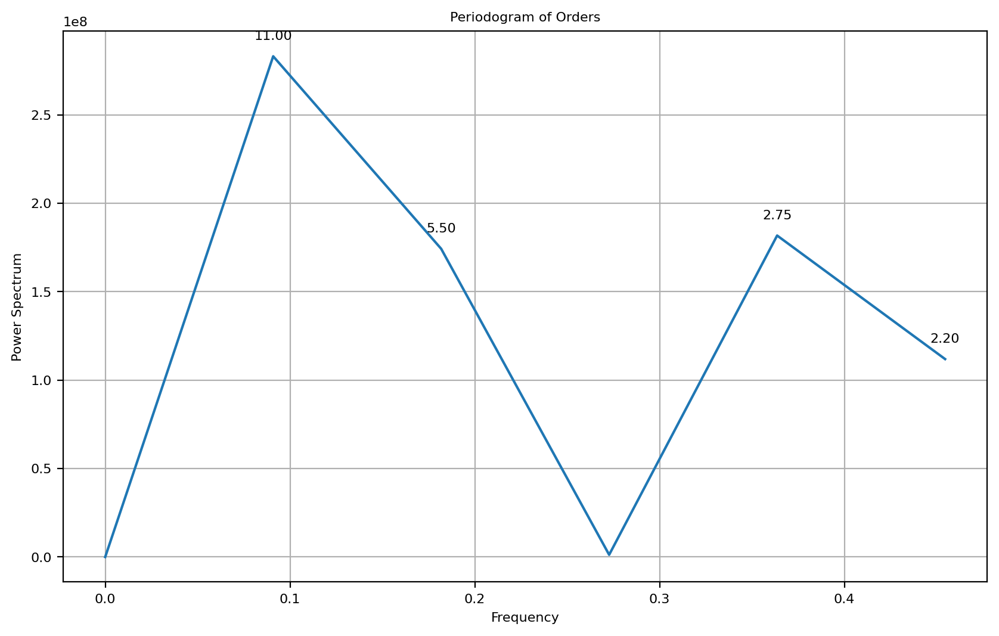

In [24]:
#periodogram - month of year

df_period = df_orders[['month','date','year','orders']].copy()
df_period['orders'] = df_period.groupby(by = ['month','year'])['orders'].transform('sum')
df_period.sort_values(by = ['date'], inplace= True)
df_period.drop_duplicates(subset = ['month','year'], inplace = True)
df_period = df_period[['date','orders']]

# Set 'time' column as index
df_period.set_index('date', inplace=True)

# Resample data to get hourly counts
hourly_orders = df_period.resample('M').sum()

# Compute periodogram
frequencies, power_spectrum = periodogram(hourly_orders['orders'])

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(frequencies, power_spectrum)
plt.title('Periodogram of Orders')
plt.xlabel('Frequency')
plt.ylabel('Power Spectrum')
plt.grid(True)

# Annotate points where power spectrum > 0.2
for freq, power in zip(frequencies, power_spectrum):
    if power > 0.5*(1e8):
        freq_ = 1/freq
        plt.annotate(f'{freq_:.2f}', (freq, power), textcoords="offset points", xytext=(0,10), ha='center')

plt.show()

## <a id='part4'>Part 4: EDA - Serial Dependence</a>
- **Objective**: Assess if past order behavior is indicative to future order behavior
- **Tasks:**
  - Deseason-data on the 24 and 168 hour level
  - Evaluate if there is/are cycles present
  - Create autocorrelation and partial correlation plots
  - Create lag plots on different levels and assess correlation
- **Overview**:
  - We found strong correlation between lag-24 (one day previous), lag-168 (one week previous) and lag-336 (two week previous)
  - Although we found a mini cycle in august with regard to a rolling mean, the median did not support the existence of a mini cycle

- De-season order information on the 24-hour, 168-hour level

Using fourier series, we create features that can be used in a linear regression to mimic seasonal behavior on the 24-hour and 168-hour level. We then predict for our time frame and subtract out these predictions to create a de-seasoned order data. Seasonality isn't fully removed but for the purposes of assessing serial dependance and lags we will be able to gain better clarity and correlation.

In [107]:
#Function that removes seasonality from the order information

def remove_seasonality(df_orders, col):
    df_ = df_orders.copy()

    t = df_['time'].to_numpy()
    y = df_[col].to_numpy()
    df_.set_index('time', inplace = True)

    #24-hour level fourier series
    fourier = Fourier(period=24, order=12)
    X_24 = fourier.in_sample(t)

    #week level fourier series
    fourier_168 = Fourier(period=168, order=60)
    X_168 = fourier_168.in_sample(t)

    X = pd.concat([X_24, X_168], axis=1)

    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)

    y_deseason = (y - y_pred)
    df_orders[col+'_deseason'] = y_deseason
    return df_orders


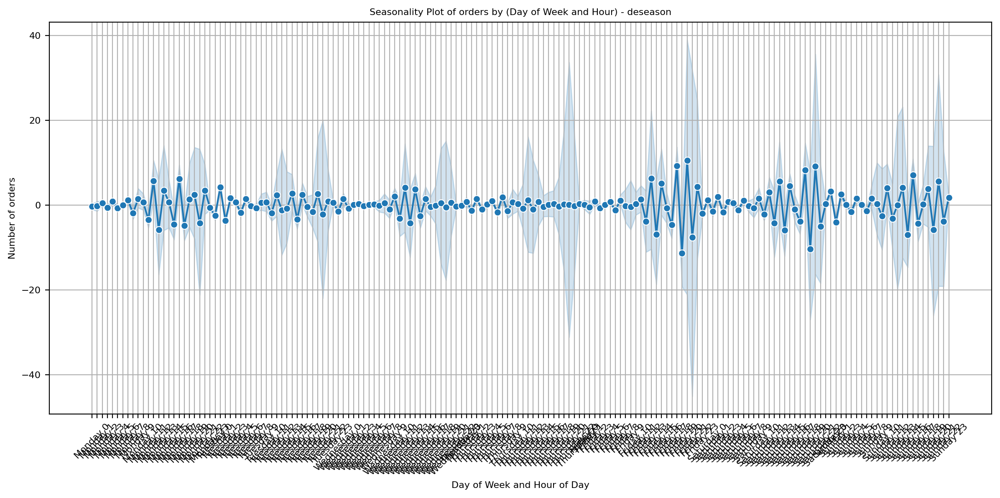

In [108]:
#Remove seasonality from the data

col = 'orders'
df_orders = remove_seasonality(df_orders, col)

# Extract day of week and hour from the 'time' column
df_orders['dayofweek'] = df_orders['time'].dt.day_name()
df_orders['hour'] = df_orders['time'].dt.hour

# Create a new column combining day of week and hour
df_orders['day_hour'] = df_orders['dayofweek'] + ' ' + df_orders['hour'].astype(str)

# Create a seasonal plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_orders, x='day_hour', y=col+'_deseason', marker='o')

plt.title('Seasonality Plot of '+col+' by (Day of Week and Hour) - deseason')
plt.xlabel('Day of Week and Hour of Day')
plt.ylabel('Number of '+col)
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()


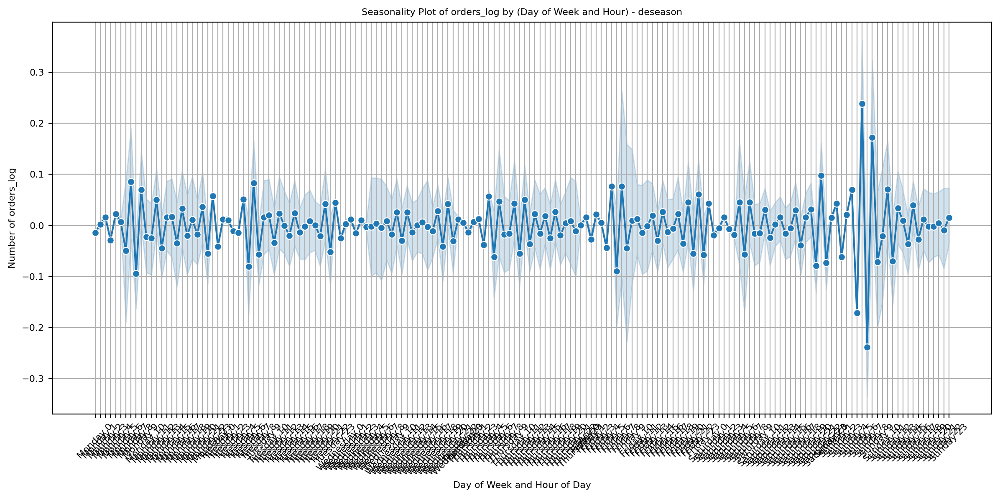

In [109]:
#Remove seasonality from the data

col = 'orders_log'
df_orders = remove_seasonality(df_orders, col)

# Extract day of week and hour from the 'time' column
df_orders['dayofweek'] = df_orders['time'].dt.day_name()
df_orders['hour'] = df_orders['time'].dt.hour

# Create a new column combining day of week and hour
df_orders['day_hour'] = df_orders['dayofweek'] + ' ' + df_orders['hour'].astype(str)

# Create a seasonal plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_orders, x='day_hour', y=col+'_deseason', marker='o')

plt.title('Seasonality Plot of '+col+' by (Day of Week and Hour) - deseason')
plt.xlabel('Day of Week and Hour of Day')
plt.ylabel('Number of '+col)
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()


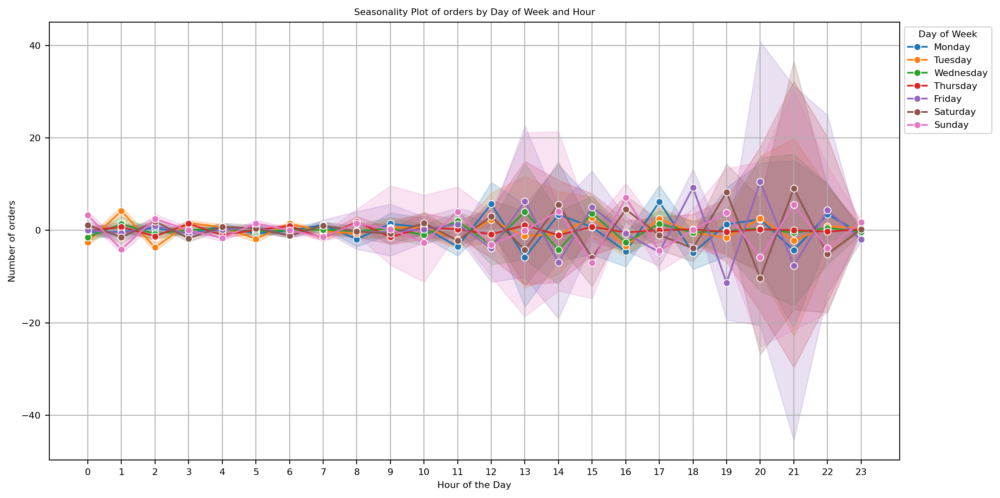

In [110]:
# Extract day of week and hour from the 'time' column
col = 'orders'
df_orders['dayofweek'] = df_orders['time'].dt.day_name()
df_orders['hour'] = df_orders['time'].dt.hour

# Create a seasonal plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_orders, x='hour', y=col+'_deseason', hue='dayofweek', marker='o')

plt.title('Seasonality Plot of '+col+' by Day of Week and Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of '+col)
plt.grid(True)
plt.xticks(range(24))  # Set x-axis ticks to show every hour
plt.legend(title='Day of Week', loc='upper left', bbox_to_anchor=(1, 1))  # Move legend outside the plot
plt.tight_layout()
plt.show()


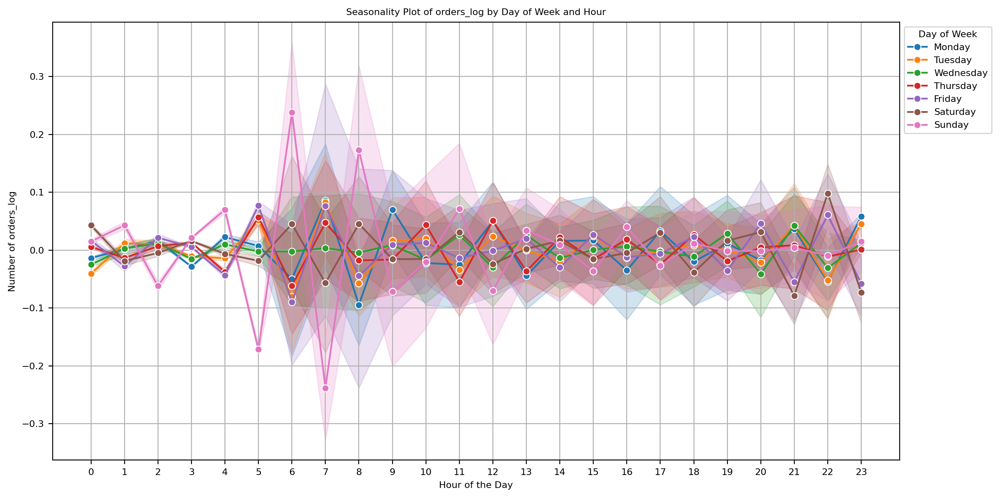

In [111]:
col = 'orders_log'
df_orders['dayofweek'] = df_orders['time'].dt.day_name()
df_orders['hour'] = df_orders['time'].dt.hour

# Create a seasonal plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_orders, x='hour', y=col+'_deseason', hue='dayofweek', marker='o')

plt.title('Seasonality Plot of '+col+' by Day of Week and Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of '+col)
plt.grid(True)
plt.xticks(range(24))  # Set x-axis ticks to show every hour
plt.legend(title='Day of Week', loc='upper left', bbox_to_anchor=(1, 1))  # Move legend outside the plot
plt.tight_layout()
plt.show()


- Evaluate if there is/are cycles present

Based on the median, we're not seeing a cycle but based on the mean we're seeing maybe the tiniest cycle appearing in the month of august. We saw this previously when looking at month level seasonality. We can account for this behavior using a deseasoned rolling mean.

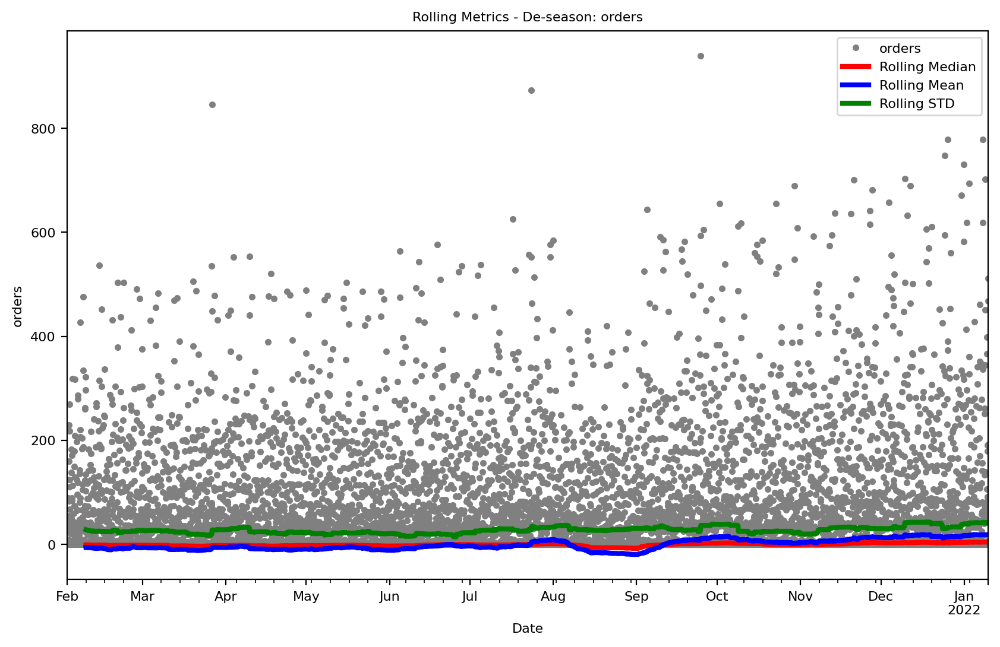

In [115]:
col = 'orders'

df_orders_time = df_orders.set_index('time')
rolling_window = df_orders_time[[col+'_deseason']].rolling(
    window=336,       # two weeks
    center=False,       
    min_periods=168,   # 168 = 24*7 (one week)
)

moving_median = rolling_window.median()  # Compute the median
moving_mean = rolling_window.mean()      # Compute the mean
moving_std = rolling_window.std()      # Compute the mean

# Plotting
ax = df_orders_time[[col]].plot(style=".", color="0.5", figsize=(10, 6))
moving_median.plot(ax=ax, linewidth=3, color='red', legend=True, label='Rolling Median')
moving_mean.plot(ax=ax, linewidth=3, color='blue', legend=True, label='Rolling Mean')
moving_std.plot(ax=ax, linewidth=3, color='green', legend=True, label='Rolling STD')
ax.legend([col, "Rolling Median", "Rolling Mean", "Rolling STD"])
ax.set_title("Rolling Metrics - De-season: "+col)
ax.set_xlabel("Date")  # Assuming the index of df_orders_time is some datetime type
ax.set_ylabel(col)

plt.show()

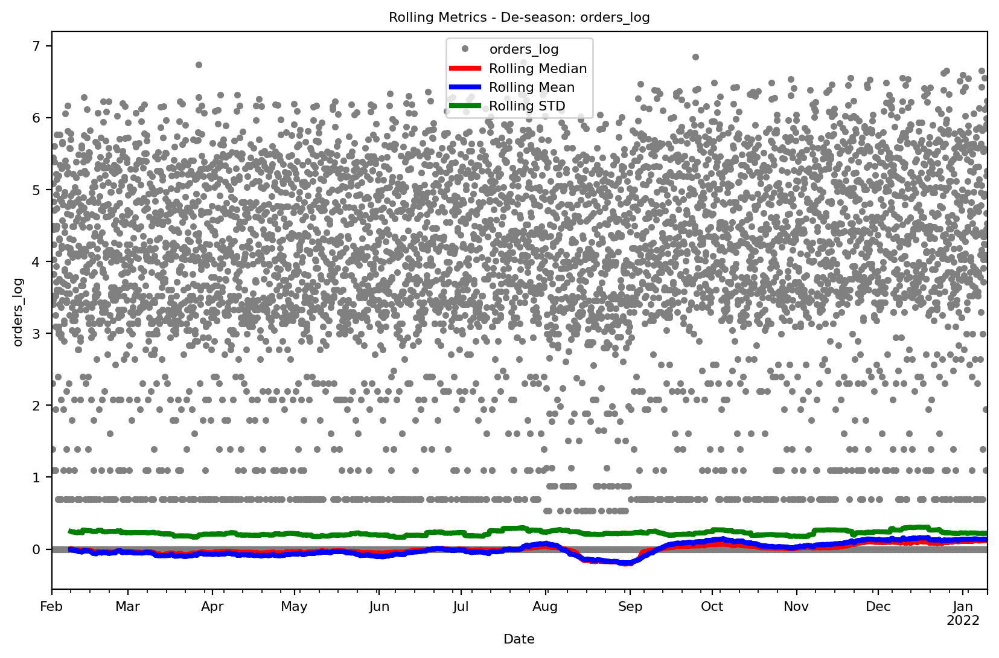

In [119]:
col = 'orders_log'

df_orders_time = df_orders.set_index('time')
rolling_window = df_orders_time[[col+'_deseason']].rolling(
    window=336,       # two weeks
    center=False,       
    min_periods=168,   # 168 = 24*7 (one week)
)

moving_median = rolling_window.median()  # Compute the median
moving_mean = rolling_window.mean()      # Compute the mean
moving_std = rolling_window.std()      # Compute the mean

# Plotting
ax = df_orders_time[[col]].plot(style=".", color="0.5", figsize=(10, 6))
moving_median.plot(ax=ax, linewidth=3, color='red', legend=True, label='Rolling Median')
moving_mean.plot(ax=ax, linewidth=3, color='blue', legend=True, label='Rolling Mean')
moving_std.plot(ax=ax, linewidth=3, color='green', legend=True, label='Rolling STD')
ax.legend([col, "Rolling Median", "Rolling Mean", "Rolling STD"])
ax.set_title("Rolling Metrics - De-season: "+col)
ax.set_xlabel("Date")  # Assuming the index of df_orders_time is some datetime type
ax.set_ylabel(col)

plt.show()

- Autocorrelation plot

We are seeing strong lag relationships in multiple 24 hour previous chunks of time, consistent with the recurrent seasonal behavior we would expect that we saw previously.

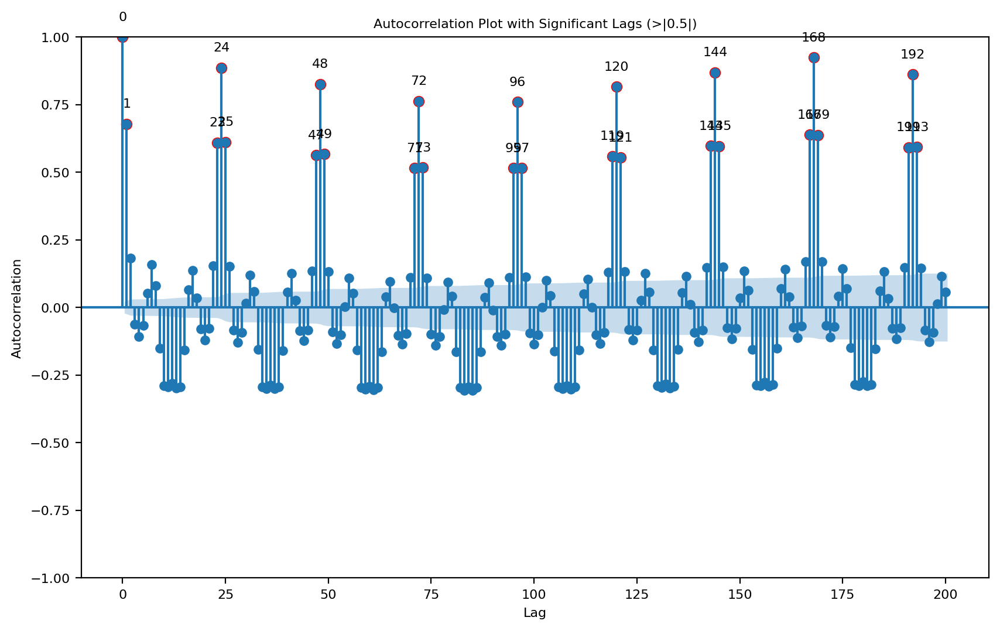

In [121]:
#Autocorrelation - full data as is

# Extract the time series data
df_corr = df_orders[['time', 'orders']].copy()
df_corr.set_index('time', inplace=True)

# Calculate the autocorrelation function
acf_values = acf(df_corr['orders'], nlags=200)

# Filter the lags where the autocorrelation is greater than 0.2
significant_lags = [lag for lag, acf in enumerate(acf_values) if abs(acf) > 0.5]

# Create a new plot displaying only significant lags
fig, ax = plt.subplots(figsize=(10, 6))
plot_acf(df_corr, lags=200, ax=ax)  # Re-plot with confidence interval
plt.scatter(significant_lags, [acf_values[lag] for lag in significant_lags], color='red', marker='o')

# Annotate each significant lag point with its lag value
for lag in significant_lags:
    plt.annotate(f'{lag}', (lag, acf_values[lag]), textcoords="offset points", xytext=(0,10), ha='center', color='black')

plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation Plot with Significant Lags (>|0.5|)')
plt.show()

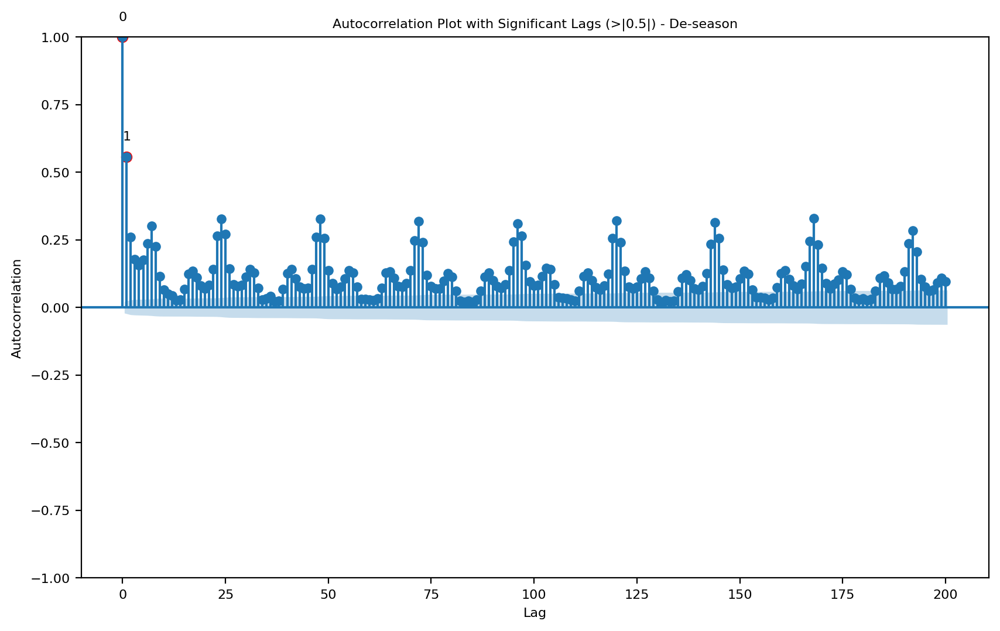

In [122]:
#De-season - autocorrelation

# Extract the time series data
df_corr = df_orders[['time', 'orders_deseason']].copy()
df_corr.set_index('time', inplace=True)

# Calculate the autocorrelation function
acf_values = acf(df_corr['orders_deseason'], nlags=200)

# Filter the lags where the autocorrelation is greater than 0.2
significant_lags = [lag for lag, acf in enumerate(acf_values) if abs(acf) > 0.5]

# Create a new plot displaying only significant lags
fig, ax = plt.subplots(figsize=(10, 6))
plot_acf(df_corr, lags=200, ax=ax)  # Re-plot with confidence interval
plt.scatter(significant_lags, [acf_values[lag] for lag in significant_lags], color='red', marker='o')

# Annotate each significant lag point with its lag value
for lag in significant_lags:
    plt.annotate(f'{lag}', (lag, acf_values[lag]), textcoords="offset points", xytext=(0,10), ha='center', color='black')

plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation Plot with Significant Lags (>|0.5|) - De-season')
plt.show()


- Partial Autocorrelation

Here we're seeing that most of this correlation can be covered by a 24 hour lag or a 168 hour lag.

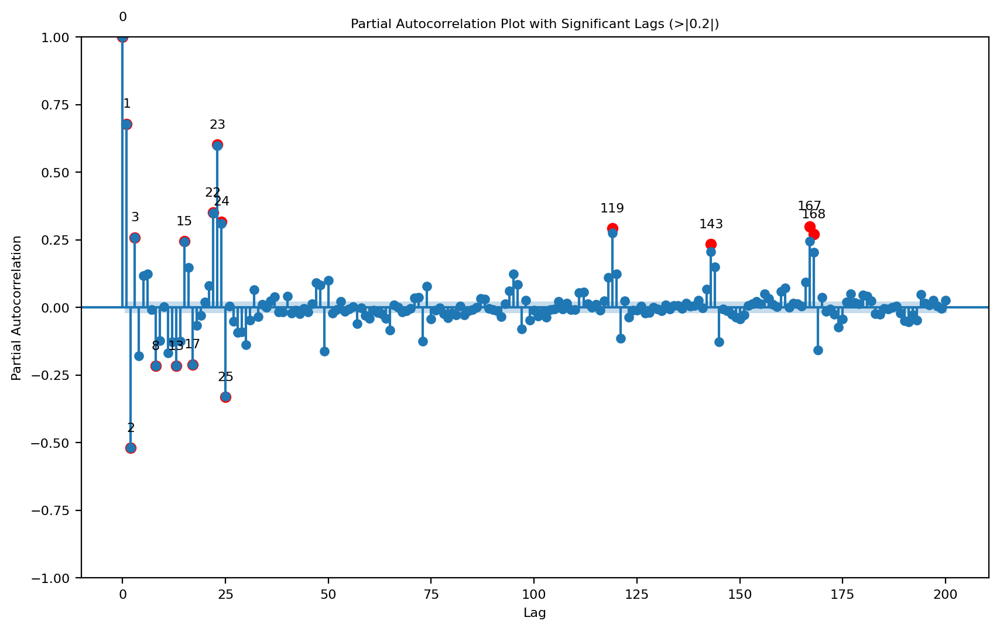

In [123]:
#partial autocorrelation - full data as is

# Extract the time series data
df_corr = df_orders[['time', 'orders']].copy()
df_corr.set_index('time', inplace=True)

# Calculate the partial autocorrelation function
pacf_values = pacf(df_corr['orders'], nlags=200)

# Filter the lags where the partial autocorrelation is greater than 0.2
significant_lags = [lag for lag, pacf in enumerate(pacf_values) if abs(pacf) > 0.2]

# Create a new plot displaying only significant lags
fig, ax = plt.subplots(figsize=(10, 6))
plot_pacf(df_corr, lags=200, alpha=0.05, ax=ax)  # Re-plot with confidence interval
plt.scatter(significant_lags, [pacf_values[lag] for lag in significant_lags], color='red', marker='o')

# Annotate each significant lag point with its lag value
for lag in significant_lags:
    plt.annotate(f'{lag}', (lag, pacf_values[lag]), textcoords="offset points", xytext=(0,10), ha='center', color='black')

plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.title('Partial Autocorrelation Plot with Significant Lags (>|0.2|)')
plt.show()

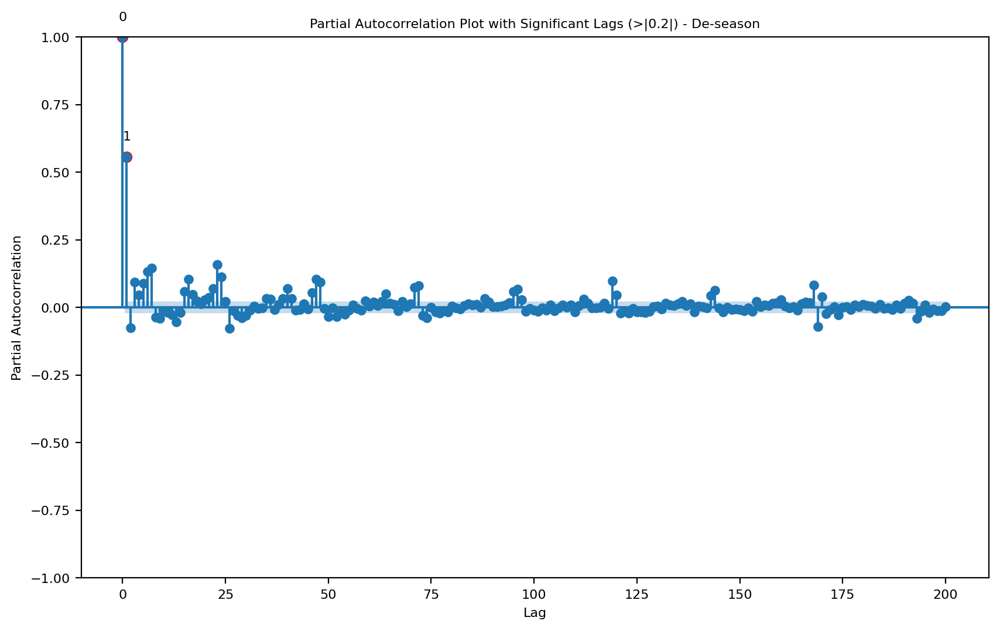

In [124]:
#partial autocorrelation - deseason

# Extract the time series data
df_corr = df_orders[['time', 'orders_deseason']].copy()
df_corr.set_index('time', inplace=True)

# Calculate the partial autocorrelation function
pacf_values = pacf(df_corr['orders_deseason'], nlags=200)

# Filter the lags where the partial autocorrelation is greater than 0.2
significant_lags = [lag for lag, pacf in enumerate(pacf_values) if abs(pacf) > 0.2]

# Create a new plot displaying only significant lags
fig, ax = plt.subplots(figsize=(10, 6))
plot_pacf(df_corr, lags=200, alpha=0.05, ax=ax)  # Re-plot with confidence interval
plt.scatter(significant_lags, [pacf_values[lag] for lag in significant_lags], color='red', marker='o')

# Annotate each significant lag point with its lag value
for lag in significant_lags:
    plt.annotate(f'{lag}', (lag, pacf_values[lag]), textcoords="offset points", xytext=(0,10), ha='center', color='black')

plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.title('Partial Autocorrelation Plot with Significant Lags (>|0.2|) - De-season')
plt.show()


- Lag plot - 24 hour lag (day previous)

lag_24
[[0.89224615]]
[7.881325]


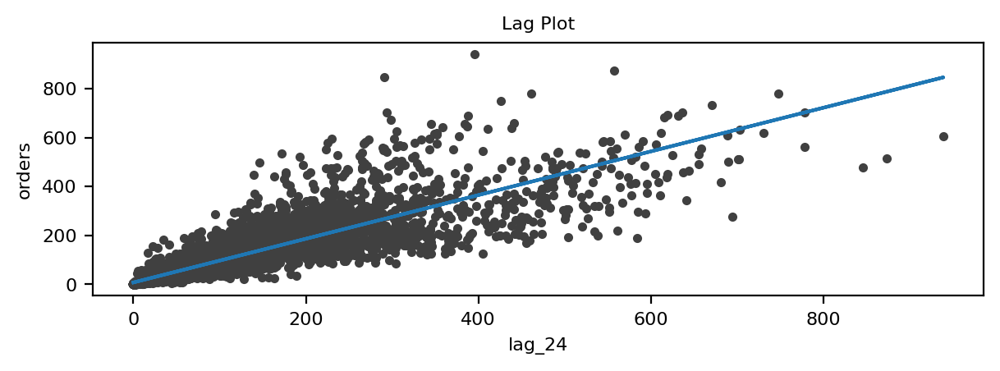

In [125]:
#lag plot - 24 hour lag (day previous)

lag_var = 'lag_24'

X = df_orders[['time','orders']].copy()
i = 24
X['lag_'+str(i)] = X['orders'].shift(i)
X.dropna(inplace = True)
X.set_index('time',inplace = True)
y = X[['orders']]  # the target
X.drop(columns = ['orders'], inplace = True)

X = X[[lag_var]]

model = LinearRegression()
model.fit(X, y)

print(lag_var)
print(model.coef_)
print(model.intercept_)

y_pred = pd.Series(model.predict(X).flatten(), index=X.index)

fig, ax = plt.subplots()
ax.plot(X[lag_var].values, y.values, '.', color='0.25')
ax.plot(X[lag_var].values, y_pred.values)
ax.set_ylabel('orders')
ax.set_xlabel(lag_var)
ax.set_title('Lag Plot');

lag_24
[[0.9860254]]
[0.03875543]


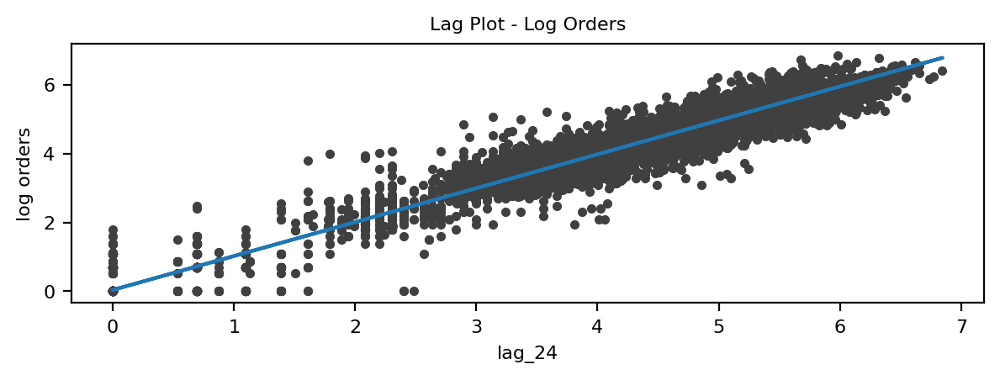

In [127]:
lag_var = 'lag_24'

X = df_orders[['time','orders_log']].copy()
i = 24
X['lag_'+str(i)] = X['orders_log'].shift(i)
X.dropna(inplace = True)
X.set_index('time',inplace = True)
y = X[['orders_log']]  # the target
X.drop(columns = ['orders_log'], inplace = True)

X = X[[lag_var]]

model = LinearRegression()
model.fit(X, y)

print(lag_var)
print(model.coef_)
print(model.intercept_)

y_pred = pd.Series(model.predict(X).flatten(), index=X.index)

fig, ax = plt.subplots()
ax.plot(X[lag_var].values, y.values, '.', color='0.25')
ax.plot(X[lag_var].values, y_pred.values)
ax.set_ylabel('log orders')
ax.set_xlabel(lag_var)
ax.set_title('Lag Plot - Log Orders');

- Lag plot - 168 hour lag (week previous)

lag_168
[[0.95943755]]
[3.50861765]


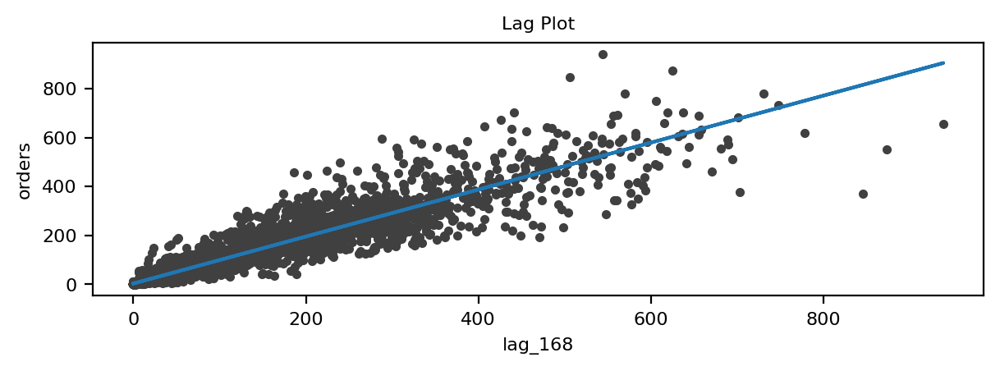

In [129]:
#lag plot - 168 hour lag (week previous)

lag_var = 'lag_168'

X = df_orders[['time','orders']].copy()
i = 168
X['lag_'+str(i)] = X['orders'].shift(i)
X.dropna(inplace = True)
X.set_index('time',inplace = True)
y = X[['orders']]  # the target
X.drop(columns = ['orders'], inplace = True)

X = X[[lag_var]]

model = LinearRegression()
model.fit(X, y)

print(lag_var)
print(model.coef_)
print(model.intercept_)

y_pred = pd.Series(model.predict(X).flatten(), index=X.index)

fig, ax = plt.subplots()
ax.plot(X[lag_var].values, y.values, '.', color='0.25')
ax.plot(X[lag_var].values, y_pred.values)
ax.set_ylabel('orders')
ax.set_xlabel(lag_var)
ax.set_title('Lag Plot');

lag_168
[[0.99185771]]
[0.02592845]


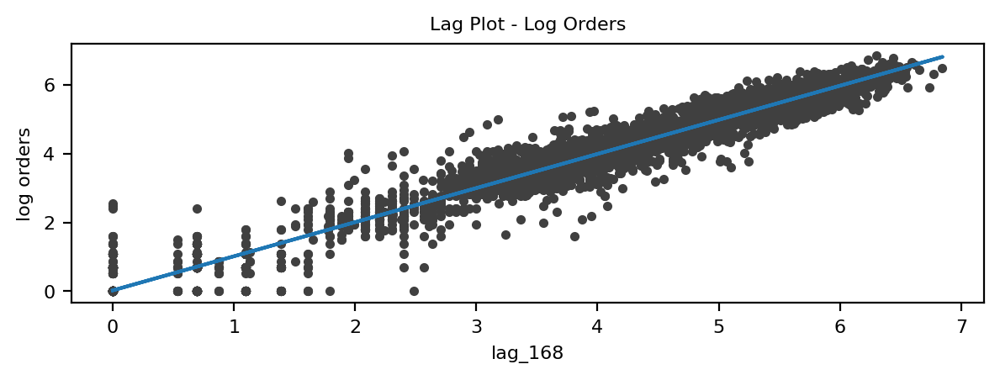

In [130]:
lag_var = 'lag_168'

X = df_orders[['time','orders_log']].copy()
i = 168
X['lag_'+str(i)] = X['orders_log'].shift(i)
X.dropna(inplace = True)
X.set_index('time',inplace = True)
y = X[['orders_log']]  # the target
X.drop(columns = ['orders_log'], inplace = True)

X = X[[lag_var]]

model = LinearRegression()
model.fit(X, y)

print(lag_var)
print(model.coef_)
print(model.intercept_)

y_pred = pd.Series(model.predict(X).flatten(), index=X.index)

fig, ax = plt.subplots()
ax.plot(X[lag_var].values, y.values, '.', color='0.25')
ax.plot(X[lag_var].values, y_pred.values)
ax.set_ylabel('log orders')
ax.set_xlabel(lag_var)
ax.set_title('Lag Plot - Log Orders');

- Lag plot - 336 hour lag (two week previous)

lag_336
[[0.96502011]]
[3.72639148]


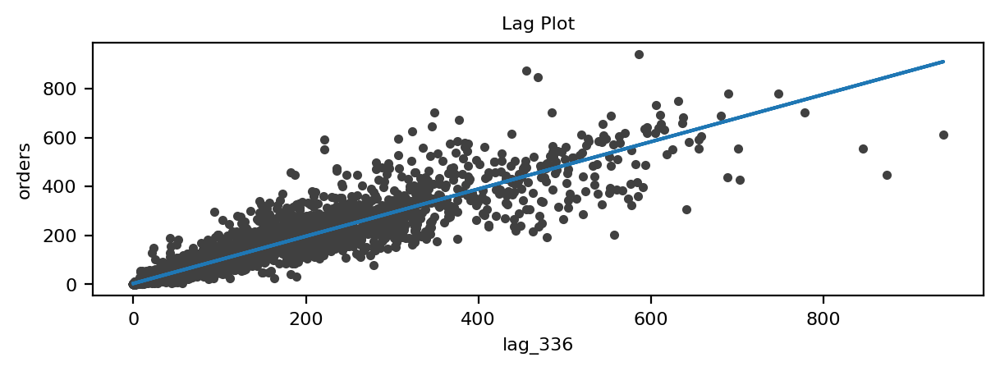

In [132]:
#lag plot - 336 hour lag (two week previous)

lag_var = 'lag_336'

X = df_orders[['time','orders']].copy()
i = 336
X['lag_'+str(i)] = X['orders'].shift(i)
X.dropna(inplace = True)
X.set_index('time',inplace = True)
y = X[['orders']]  # the target
X.drop(columns = ['orders'], inplace = True)

X = X[[lag_var]]

model = LinearRegression()
model.fit(X, y)

print(lag_var)
print(model.coef_)
print(model.intercept_)

y_pred = pd.Series(model.predict(X).flatten(), index=X.index)

fig, ax = plt.subplots()
ax.plot(X[lag_var].values, y.values, '.', color='0.25')
ax.plot(X[lag_var].values, y_pred.values)
ax.set_ylabel('orders')
ax.set_xlabel(lag_var)
ax.set_title('Lag Plot');

lag_336
[[0.99383924]]
[0.02493596]


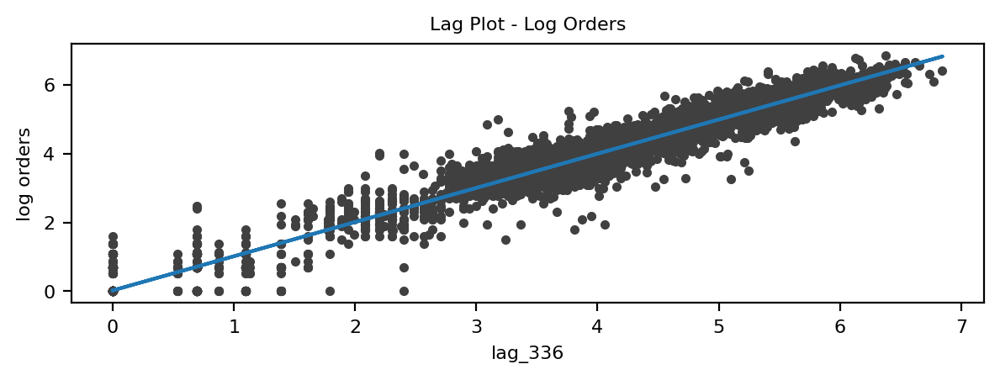

In [133]:
lag_var = 'lag_336'

X = df_orders[['time','orders_log']].copy()
i = 336
X['lag_'+str(i)] = X['orders_log'].shift(i)
X.dropna(inplace = True)
X.set_index('time',inplace = True)
y = X[['orders_log']]  # the target
X.drop(columns = ['orders_log'], inplace = True)

X = X[[lag_var]]

model = LinearRegression()
model.fit(X, y)

print(lag_var)
print(model.coef_)
print(model.intercept_)

y_pred = pd.Series(model.predict(X).flatten(), index=X.index)

fig, ax = plt.subplots()
ax.plot(X[lag_var].values, y.values, '.', color='0.25')
ax.plot(X[lag_var].values, y_pred.values)
ax.set_ylabel('log orders')
ax.set_xlabel(lag_var)
ax.set_title('Lag Plot - Log Orders');

## <a id='part5'>Part 5: Feature Creation</a>
- **Objective**: Based on EDA create features to be used in predicting orders
- **Tasks:**
  - Lag features
  - Seasonality features: fourier series
  - One hot encoded features: day of week
  - Rolling window features
- **Overview:**
  - We created functions to create dataframes to store the features we will use to build models with. We created two lag features (168-hour previous week and 336-hour previous two week), two types of fourier series (24-seasonality based and 168-seasonality based), and one hot encoded the day of the week. We created a feature for the mini cycle we saw in august but it lead to worse model performance so it was moved into its own function yet left unused.
  

In [18]:
#functions to create features for linear regression

def create_features_train(df_in, col_include):
    df_ = df_in.copy()

    #Lag features
    df_['lag_168'] = df_[TARGET].shift(168)
    df_['lag_336'] = df_[TARGET].shift(336)
    col_include.append('lag_168')
    col_include.append('lag_336')
    df_.dropna(inplace = True)
    df_.reset_index(drop = True, inplace = True)

    #Seasonality features
    df_['dayofweek'] = df_['time'].dt.day_of_week
    df_['hour'] = df_['time'].dt.hour

    #one hot encode day of week
    for day in df_['dayofweek'].unique().tolist():
        df_['ohe_'+str(day)] = 0
        df_.loc[df_['dayofweek']==day, 'ohe_'+str(day)] = 1
        col_include.append('ohe_'+str(day))

    t = df_['time'].to_numpy()

    #24-hour level fourier series
    fourier = Fourier(period=24, order=12)
    X_24 = fourier.in_sample(t)

    #week level fourier series
    fourier_168 = Fourier(period=168, order=60)
    X_168 = fourier_168.in_sample(t)

    #concat all features together
    df_.set_index('time', inplace = True)
    y_train = df_[TARGET].to_numpy()
    df_train = pd.concat([X_24, X_168, df_[col_include]], axis=1)

    return df_train, y_train

def create_features_train_w_cycle(df_in, col_include):
    df_ = df_in.copy()

    #Lag features
    df_['lag_168'] = df_[TARGET].shift(168)
    df_['lag_336'] = df_[TARGET].shift(336)
    col_include.append('lag_168')
    col_include.append('lag_336')

    #Seasonality features
    df_['dayofweek'] = df_['time'].dt.day_of_week
    df_['hour'] = df_['time'].dt.hour

    #one hot encode day of week
    for day in df_['dayofweek'].unique().tolist():
        df_['ohe_'+str(day)] = 0
        df_.loc[df_['dayofweek']==day, 'ohe_'+str(day)] = 1
        col_include.append('ohe_'+str(day))

    t = df_['time'].to_numpy()

    #24-hour level fourier series
    fourier = Fourier(period=24, order=12)
    X_24 = fourier.in_sample(t)

    #week level fourier series
    fourier_168 = Fourier(period=168, order=60)
    X_168 = fourier_168.in_sample(t)

    #Cycle
    #deseason orders and calc rolling mean and rolling median
    df_deseason = df_.copy()
    df_deseason = remove_seasonality(df_deseason)
    df_deseason.set_index('time', inplace = True)

    rolling_window = df_deseason[[TARGET+'_deseason']].rolling(
        window=336,       # two weeks
        center=False,       
        min_periods=168,   # 168 = 24*7 (one week)
    )

    moving_median = rolling_window.median()  # Compute the median
    moving_mean = rolling_window.mean()      # Compute the mean

    df_deseason['rolling_median'] = moving_median['orders_deseason']
    df_deseason['rolling_mean'] = moving_mean['orders_deseason']

    #concat all features together
    df_.set_index('time', inplace = True)
    df_train = pd.concat([X_24, X_168, df_[col_include], df_deseason[['rolling_median','rolling_mean',TARGET]]], axis=1)
    df_train.dropna(inplace = True)
    y_train = df_train[TARGET].to_numpy()
    df_train.drop(columns = [TARGET], inplace = True)

    return df_train, y_train

def create_features_val(df_in, df_val_in):
    df_val = df_val_in.copy()
    df_in = df_orders.copy()
    y_val = df_val[TARGET].to_numpy()
    df_in['val'] = 0
    df_val['val'] = 1
    df_in = df_in[['time',TARGET,'val']]
    df_val = df_val[['time',TARGET,'val']]
    df_ = pd.concat([df_in, df_val], ignore_index = True)

    df_train, y_train = create_features_train(df_, ['val'])
    df_val_out = df_train[df_train['val']==1].copy()
    df_val_out.drop(columns = ['val'], inplace = True)
    return df_val_out, y_val


In [19]:
#Create training and validation feature dataframes

TARGET = 'orders'
X_train, y_train = create_features_train(df_orders, [])
X_val, y_val = create_features_val(df_orders, df_val)
df_orders_in = df_orders[['time',TARGET]]
df_val_in = df_val[['time',TARGET]]
df_in = pd.concat([df_orders_in,df_val_in], ignore_index = True)
df_in.sort_values(by = ['time'], inplace = True)
df_in.reset_index(drop = True, inplace = True)
X_test, y_test = create_features_val(df_in, df_test)

X_val = X_val[X_train.columns]
X_test = X_test[X_train.columns]

TARGET = 'orders_log'
X_train_log, y_train_log = create_features_train(df_orders, [])
X_val_log, y_val_log = create_features_val(df_orders, df_val)
df_orders_in = df_orders[['time',TARGET]]
df_val_in = df_val[['time',TARGET]]
df_in = pd.concat([df_orders_in,df_val_in], ignore_index = True)
df_in.sort_values(by = ['time'], inplace = True)
df_in.reset_index(drop = True, inplace = True)
X_test_log, y_test_log = create_features_val(df_in, df_test)

X_val_log = X_val_log[X_train_log.columns]
X_test_log = X_test_log[X_train_log.columns]


## <a id='part6'>Part 6: Model Build and Performance</a>
- **Objective**: Build multiple types of models and assess performance
- **Tasks:**
  - By model (Lasso, Linear Regression, XGBoost, ARIMA/SARIMA)
    - Model build
    - Validation prediction
    - Performance assessment

- General Overview:
Our training population is 2021-02-01 until 2022-01-09. Our validation population is the second and third week of august that we use for further feature selection and model tuning (2022-01-10 until 2022-01-23). Our test population is the last full week Monday - Friday of the data available (2022-01-24 until 2022-01-30). 

### Lasso
Overview: We build a Lasso model with 'orders' as our target variable. We find that the Lasso model to predict orders yields a test MSE of 855 and R-sqrd of .94

- Lasso: Model build

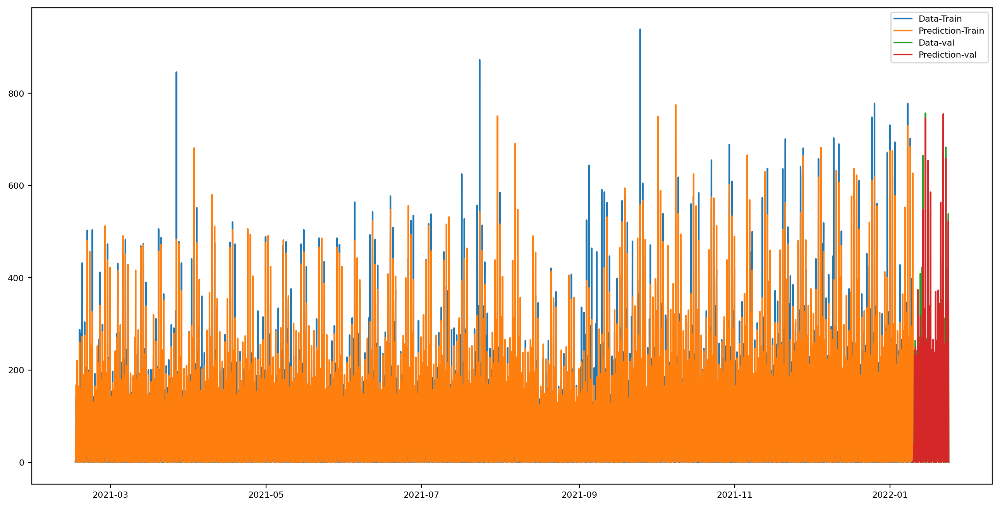

In [303]:
#Lasso - Orders: Model build

#build model using training dataframe
model = Lasso(alpha=0.1)
model.fit(X_train, y_train)
y_pred_train = model.predict(X_train)

#predict orders for validation timeframe
y_pred_val = model.predict(X_val)
y_pred_test = model.predict(X_test)

# Plot
t = X_train.index
t_val = X_val.index
plt.figure(figsize=(16, 8))
plt.plot(t, y_train, label='Data-Train')
plt.plot(t, y_pred_train, label='Prediction-Train')
plt.plot(t_val, y_val, label='Data-val')
plt.plot(t_val, y_pred_val, label='Prediction-val')
plt.legend()
plt.show()


In [304]:
#Lasso - Orders: feature importance

df_features = pd.DataFrame({
    'feature': X_train.columns,
    'coeff': model.coef_
})

df_features['importance'] = df_features['coeff'].abs()/df_features['coeff'].abs().max()
df_features.sort_values(by = ['importance'], ascending = False, inplace = True)
print("Lasso - Orders: feature importance")
print(df_features.head(15))

Lasso - Orders: feature importance
         feature     coeff  importance
7      cos(4,24) -1.324627    1.000000
6      sin(4,24)  0.873237    0.659232
4      sin(3,24)  0.858120    0.647820
0      sin(1,24)  0.687792    0.519234
24    sin(1,168) -0.545219    0.411602
144      lag_168  0.533260    0.402574
145      lag_336  0.447440    0.337786
76   sin(27,168) -0.273216    0.206259
5      cos(3,24)  0.210470    0.158890
70   sin(24,168) -0.180422    0.136206
12     sin(7,24) -0.158385    0.119570
1      cos(1,24)  0.149080    0.112545
58   sin(18,168) -0.145358    0.109735
80   sin(29,168)  0.126366    0.095397
55   cos(16,168) -0.120720    0.091135


- Lasso: Performance Metrics - Validation

In [305]:
#Lasso: performance metrics - MAE, MSE, RMSE, R-sqrd

#subset to only predict a week out
df_val_pred = pd.concat([pd.DataFrame(y_val, columns = ['orders']),pd.DataFrame(y_pred_val, columns = ['predictions'])], axis = 1)
df_val_pred.reset_index(inplace = True)
df_val_pred = df_val_pred[df_val_pred['index']<168]

print("Lasso - Orders: Validation W1:")
mae = mean_absolute_error(df_val_pred['orders'], df_val_pred['predictions'])
print("Mean Absolute Error (MAE):", mae)
mse = mean_squared_error(df_val_pred['orders'], df_val_pred['predictions'])
print("Mean Squared Error (MSE):", mse)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
r2 = r2_score(df_val_pred['orders'], df_val_pred['predictions'])
print("R-squared (R²):", r2)

#subset to only predict a week out
df_val_pred = pd.concat([pd.DataFrame(y_val, columns = ['orders']),pd.DataFrame(y_pred_val, columns = ['predictions'])], axis = 1)
df_val_pred.reset_index(inplace = True)
df_val_pred = df_val_pred[df_val_pred['index']>=168]

print(" ")
print("Lasso - Orders: Validation W2:")
mae = mean_absolute_error(df_val_pred['orders'], df_val_pred['predictions'])
print("Mean Absolute Error (MAE):", mae)
mse = mean_squared_error(df_val_pred['orders'], df_val_pred['predictions'])
print("Mean Squared Error (MSE):", mse)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
r2 = r2_score(df_val_pred['orders'], df_val_pred['predictions'])
print("R-squared (R²):", r2)


Lasso - Orders: Validation W1:
Mean Absolute Error (MAE): 13.827708281877584
Mean Squared Error (MSE): 809.5164583105359
Root Mean Squared Error (RMSE): 33.474812278786274
R-squared (R²): 0.9617081997825571
 
Lasso - Orders: Validation W2:
Mean Absolute Error (MAE): 17.152821694787544
Mean Squared Error (MSE): 972.035864765343
Root Mean Squared Error (RMSE): 33.474812278786274
R-squared (R²): 0.9482609855727819


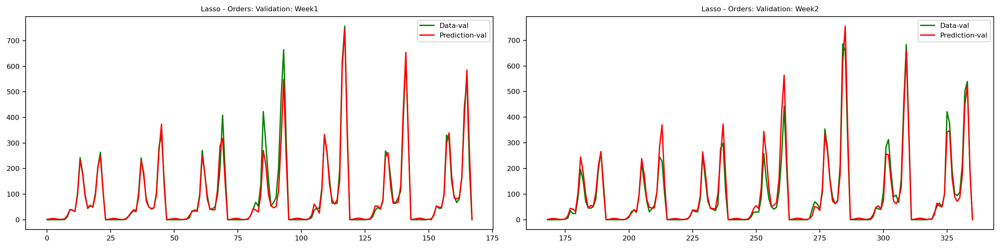

In [306]:
#Lasso - Orders: one week prediction plot - validation

#subset to only predict a week out
df_val_pred = pd.concat([pd.DataFrame(y_val, columns = ['orders']),pd.DataFrame(y_pred_val, columns = ['predictions'])], axis = 1)
df_val_pred.reset_index(inplace = True)

df_val_predW1 = df_val_pred[df_val_pred['index']<168]
df_val_predW2 = df_val_pred[df_val_pred['index']>=168]

# Create a figure and a set of subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 4))  # 1 row, 2 columns

# First plot
axes[0].plot(df_val_predW1.index, df_val_predW1['orders'], label='Data-val', color='green')
axes[0].plot(df_val_predW1.index, df_val_predW1['predictions'], label='Prediction-val', color='red')
axes[0].legend()
axes[0].set_title("Lasso - Orders: Validation: Week1")

# Second plot
axes[1].plot(df_val_predW2.index, df_val_predW2['orders'], label='Data-val', color='green')
axes[1].plot(df_val_predW2.index, df_val_predW2['predictions'], label='Prediction-val', color='red')
axes[1].legend()
axes[1].set_title("Lasso - Orders: Validation: Week2")

# Adjust the layout so that the plots do not overlap
plt.tight_layout()

# Show the plots
plt.show()


- Lasso: Performance Metrics - Test

In [307]:
#Lasso: performance metrics - MAE, MSE, RMSE, R-sqrd - test

#subset to only predict a week out
df_test_pred = pd.concat([pd.DataFrame(y_test, columns = ['orders']),pd.DataFrame(y_pred_test, columns = ['predictions'])], axis = 1)
df_test_pred.reset_index(inplace = True)
# df_test_pred = df_test_pred[df_test_pred['index']<168]

print("Lasso - Orders: Test:")
mae = mean_absolute_error(df_test_pred['orders'], df_test_pred['predictions'])
print("Mean Absolute Error (MAE):", mae)
mse = mean_squared_error(df_test_pred['orders'], df_test_pred['predictions'])
print("Mean Squared Error (MSE):", mse)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
r2 = r2_score(df_test_pred['orders'], df_test_pred['predictions'])
print("R-squared (R²):", r2)

Lasso - Orders: Test:
Mean Absolute Error (MAE): 14.594986717387707
Mean Squared Error (MSE): 855.1654053113906
Root Mean Squared Error (RMSE): 33.474812278786274
R-squared (R²): 0.9492429080292863


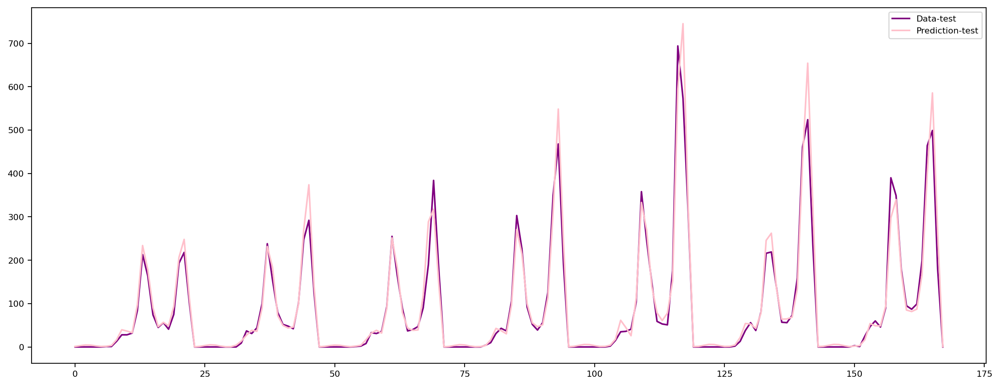

In [308]:
#Lasso - Orders: one week prediction plot - test

plt.figure(figsize=(16, 6))
plt.plot(df_test_pred.index, df_test_pred['orders'], label='Data-test', color = 'purple')
plt.plot(df_test_pred.index, df_test_pred['predictions'], label='Prediction-test', color = 'pink')
plt.legend()
plt.show()


### Linear Regression
Overview: We build a LR model with 'orders_log' as our target variable and once we find predictions, we take the prediction to the e and subtract 1 and convert this value to an integer. We find that the LR model to predict orders yields a test MSE of 858 very close to the Lasso and R-sqrd of .949.

- Linear Regression: Model Build

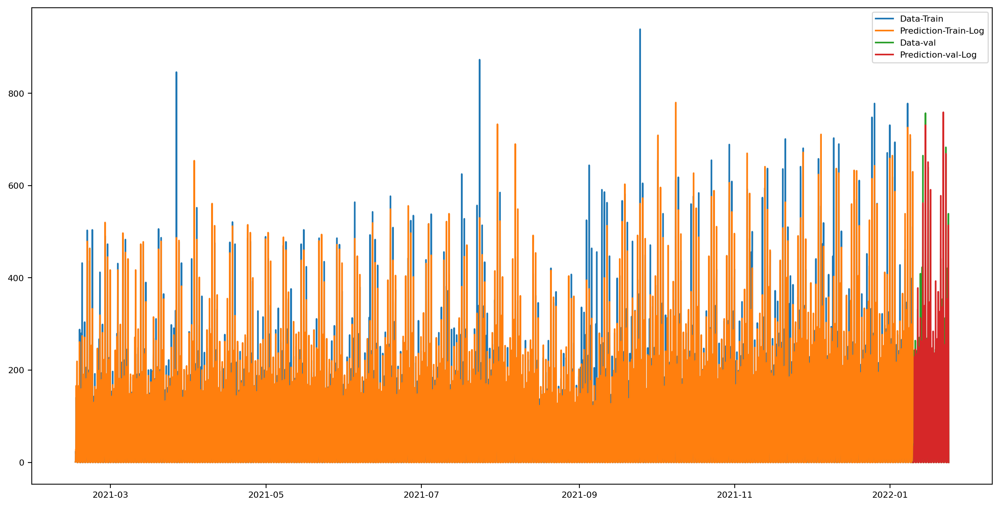

In [309]:
#build model using training dataframe

#remove the one hot encoded columns because they were being considered as too important
for col in X_train_log.columns:
    if col.find('ohe') > -1:
        X_train_log.drop(columns = [col], inplace = True)
X_val_log = X_val_log[X_train_log.columns]
X_test_log = X_test_log[X_train_log.columns]

model_log = LinearRegression()
model_log.fit(X_train_log, y_train_log)
y_pred_train_log = model_log.predict(X_train_log)

#predict orders for validation timeframe
y_pred_val_log = model_log.predict(X_val_log)
y_pred_test_log = model_log.predict(X_test_log)

#reverse the log and subtract 1
y_pred_train_log = (np.exp(y_pred_train_log) - 1).astype(int)
y_pred_val_log = (np.exp(y_pred_val_log) - 1).astype(int)
y_pred_test_log = (np.exp(y_pred_test_log) - 1).astype(int)

# Plot
t = X_train_log.index
t_val = X_val_log.index
plt.figure(figsize=(16, 8))
plt.plot(t, y_train, label='Data-Train')
plt.plot(t, y_pred_train_log, label='Prediction-Train-Log')
plt.plot(t_val, y_val, label='Data-val')
plt.plot(t_val, y_pred_val_log, label='Prediction-val-Log')
plt.legend()
plt.show()

In [310]:
#LR - Log Orders: Feature importance

df_features_log = pd.DataFrame({
    'feature': X_train_log.columns,
    'coeff': model_log.coef_
})

df_features_log['importance'] = df_features_log['coeff'].abs()/df_features_log['coeff'].abs().max().round(2)
df_features_log.sort_values(by = ['importance'], ascending = False, inplace = True)
print('LR - Log Orders')
print(df_features_log.head(15))

LR - Log Orders
        feature         coeff  importance
37   cos(7,168)  2.236299e+10    1.000000
1     cos(1,24) -2.236299e+10    1.000000
36   sin(7,168)  1.140262e+10    0.509888
0     sin(1,24) -1.140262e+10    0.509888
50  sin(14,168) -9.317662e+09    0.416656
2     sin(2,24)  9.317662e+09    0.416656
5     cos(3,24) -8.733351e+09    0.390527
65  cos(21,168)  8.733351e+09    0.390527
79  cos(28,168) -8.464303e+09    0.378496
7     cos(4,24)  8.464303e+09    0.378496
6     sin(4,24)  7.444973e+09    0.332915
78  sin(28,168) -7.444973e+09    0.332915
9     cos(5,24)  5.763856e+09    0.257741
93  cos(35,168) -5.763856e+09    0.257741
92  sin(35,168)  5.542103e+09    0.247825


- Linear Regression: Performance Metrics - Validation

In [316]:
#LR - Log Orders: performance metrics - MAE, MSE, RMSE, R-sqrd

#subset to only predict a week out
df_val_pred_log = pd.concat([pd.DataFrame(y_val, columns = ['orders']),pd.DataFrame(y_pred_val_log, columns = ['predictions'])], axis = 1)
df_val_pred_log.reset_index(inplace = True)
df_val_pred_log = df_val_pred_log[df_val_pred_log['index']<168]

print("LR - Log Orders: Validation W1:")
mae = mean_absolute_error(df_val_pred_log['orders'], df_val_pred_log['predictions'])
print("Mean Absolute Error (MAE):", mae)
mse = mean_squared_error(df_val_pred_log['orders'], df_val_pred_log['predictions'])
print("Mean Squared Error (MSE):", mse)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
r2 = r2_score(df_val_pred_log['orders'], df_val_pred_log['predictions'])
print("R-squared (R²):", r2)

#subset to only predict a week out
df_val_pred_log = pd.concat([pd.DataFrame(y_val, columns = ['orders']),pd.DataFrame(y_pred_val_log, columns = ['predictions'])], axis = 1)
df_val_pred_log.reset_index(inplace = True)
df_val_pred_log = df_val_pred_log[df_val_pred_log['index']>=168]

print(" ")
print("LR - Log Orders: Validation W2:")
mae = mean_absolute_error(df_val_pred_log['orders'], df_val_pred_log['predictions'])
print("Mean Absolute Error (MAE):", mae)
mse = mean_squared_error(df_val_pred_log['orders'], df_val_pred_log['predictions'])
print("Mean Squared Error (MSE):", mse)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
r2 = r2_score(df_val_pred_log['orders'], df_val_pred_log['predictions'])
print("R-squared (R²):", r2)


LR - Log Orders: Validation W1:
Mean Absolute Error (MAE): 13.416666666666666
Mean Squared Error (MSE): 785.7380952380952
Root Mean Squared Error (RMSE): 33.474812278786274
R-squared (R²): 0.9628329654607842
 
LR - Log Orders: Validation W2:
Mean Absolute Error (MAE): 15.994047619047619
Mean Squared Error (MSE): 1037.4345238095239
Root Mean Squared Error (RMSE): 33.474812278786274
R-squared (R²): 0.9447799801012149


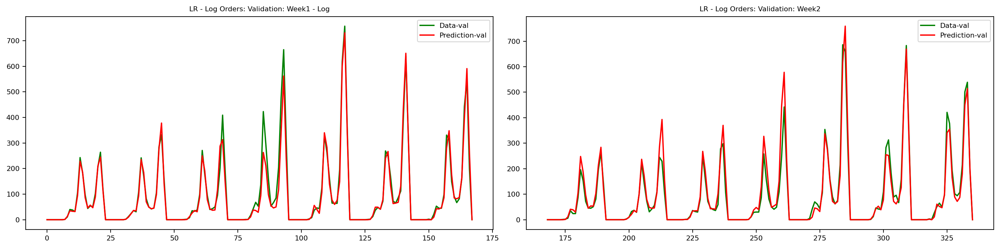

In [312]:
#LR - Log Orders: one week prediction plot - validation

#subset to only predict a week out
df_val_pred = pd.concat([pd.DataFrame(y_val, columns = ['orders']),pd.DataFrame(y_pred_val_log, columns = ['predictions'])], axis = 1)
df_val_pred.reset_index(inplace = True)

df_val_predW1 = df_val_pred[df_val_pred['index']<168]
df_val_predW2 = df_val_pred[df_val_pred['index']>=168]

# Create a figure and a set of subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 4))  # 1 row, 2 columns

# First plot
axes[0].plot(df_val_predW1.index, df_val_predW1['orders'], label='Data-val', color='green')
axes[0].plot(df_val_predW1.index, df_val_predW1['predictions'], label='Prediction-val', color='red')
axes[0].legend()
axes[0].set_title("LR - Log Orders: Validation: Week1 - Log")

# Second plot
axes[1].plot(df_val_predW2.index, df_val_predW2['orders'], label='Data-val', color='green')
axes[1].plot(df_val_predW2.index, df_val_predW2['predictions'], label='Prediction-val', color='red')
axes[1].legend()
axes[1].set_title("LR - Log Orders: Validation: Week2")

# Adjust the layout so that the plots do not overlap
plt.tight_layout()

# Show the plots
plt.show()

- Linear Regression: Performance Metrics - Test

In [314]:
#LR - Log Orders: performance metrics - MAE, MSE, RMSE, R-sqrd - test

#subset to only predict a week out
df_test_pred = pd.concat([pd.DataFrame(y_test, columns = ['orders']),pd.DataFrame(y_pred_test_log, columns = ['predictions'])], axis = 1)
df_test_pred.reset_index(inplace = True)

print("LR - Log Orders: Test:")
mae = mean_absolute_error(df_test_pred['orders'], df_test_pred['predictions'])
print("Mean Absolute Error (MAE):", mae)
mse = mean_squared_error(df_test_pred['orders'], df_test_pred['predictions'])
print("Mean Squared Error (MSE):", mse)
mse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
r2 = r2_score(df_test_pred['orders'], df_test_pred['predictions'])
print("R-squared (R²):", r2)

LR - Log Orders: Test:
Mean Absolute Error (MAE): 13.595238095238095
Mean Squared Error (MSE): 858.0119047619048
Root Mean Squared Error (RMSE): 33.474812278786274
R-squared (R²): 0.9490739582173471


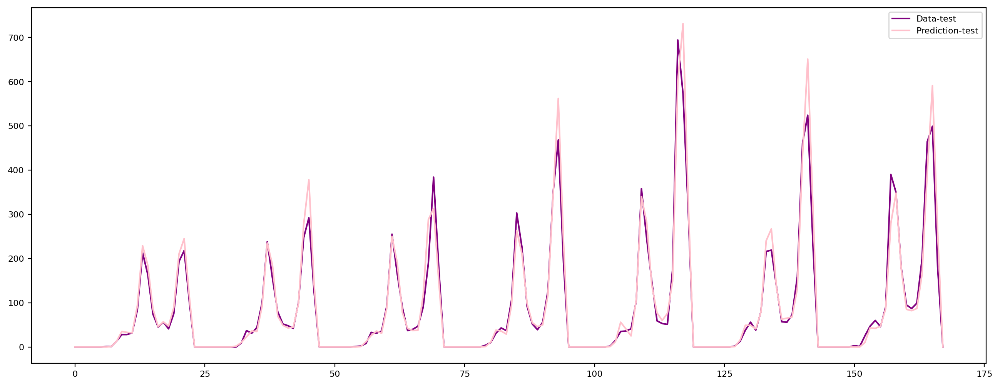

In [315]:
#LR - Log Orders: one week prediction plot - test

plt.figure(figsize=(16, 6))
plt.plot(df_test_pred.index, df_test_pred['orders'], label='Data-test', color = 'purple')
plt.plot(df_test_pred.index, df_test_pred['predictions'], label='Prediction-test', color = 'pink')
plt.legend()
plt.show()


## XGBoost

Overview: For the XGBoost model we first began looking with the same features that we used in the Lasso model. This gave a slightly worse Mean Squared Error score of *2484*. 

- XGBoost - Orders: Model build

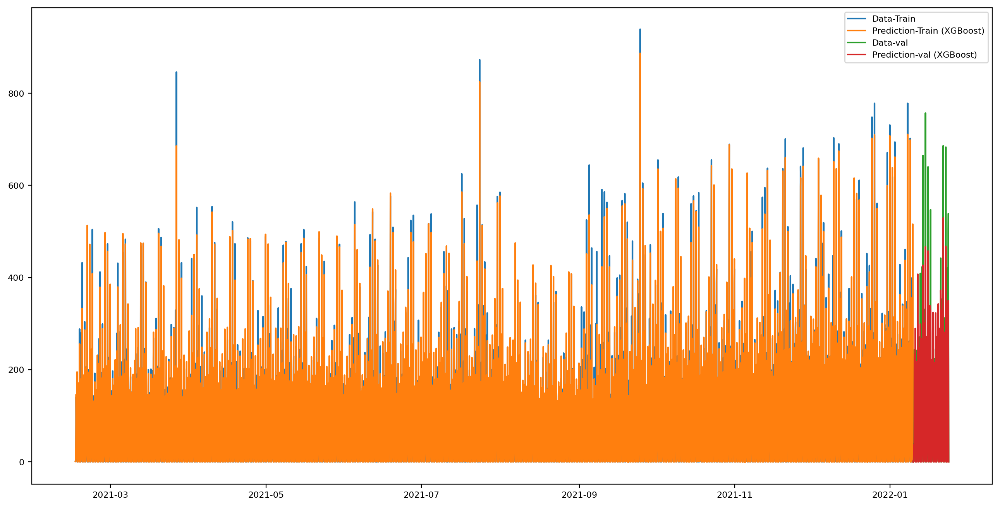

In [27]:
#XGBoost - Orders: model build

# Train the XGBoost model
params = dict(n_estimators=1000, max_depth=5, learning_rate=0.01, n_jobs=4)
xgb = XGBRegressor(**params)
xgb.fit(X_train, y_train)
y_pred_train_xgb = xgb.predict(X_train)
y_pred_val_xgb = xgb.predict(X_val)

t = X_train.index
t_val = X_val.index

# Plot for XGBoost
plt.figure(figsize=(16, 8))
plt.plot(t, y_train, label='Data-Train')
plt.plot(t, y_pred_train_xgb, label='Prediction-Train (XGBoost)')
plt.plot(t_val, y_val, label='Data-val')
plt.plot(t_val, y_pred_val_xgb, label='Prediction-val (XGBoost)')
plt.legend()
plt.show()

In [28]:
#XGBoost - Orders: Feature importance

df_features_xgb = pd.DataFrame({
    'feature': X_train.columns,
    'coeff': xgb.feature_importances_
})

df_features_xgb['importance'] = (df_features_xgb['coeff'].abs()/df_features_xgb['coeff'].abs().max()).round(2)
df_features_xgb.sort_values(by = ['importance'], ascending = False, inplace = True)
print('XGBoost - Orders')
print(df_features_xgb.head(15))

XGBoost - Orders
         feature     coeff  importance
144      lag_168  0.218302        1.00
145      lag_336  0.119935        0.55
132  sin(55,168)  0.062205        0.28
94   sin(36,168)  0.017728        0.08
102  sin(40,168)  0.014842        0.07
126  sin(52,168)  0.012845        0.06
35    cos(6,168)  0.013479        0.06
77   cos(27,168)  0.012744        0.06
81   cos(29,168)  0.011027        0.05
66   sin(22,168)  0.010154        0.05
124  sin(51,168)  0.011179        0.05
76   sin(27,168)  0.009679        0.04
75   cos(26,168)  0.007998        0.04
136  sin(57,168)  0.008239        0.04
67   cos(22,168)  0.007852        0.04


- XGBoost - Orders: Performance Metrics - Validation

In [29]:
# Calculate SMAPE
def calculate_smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_pred) + np.abs(y_true)))

# Evaluation Metrics
mse_xgb = mean_squared_error(y_val, y_pred_val_xgb)
mae_xgb = mean_absolute_error(y_val, y_pred_val_xgb)
smape_xgb = calculate_smape(y_val, y_pred_val_xgb)
print(f"MSE (XGBoost): {mse_xgb}")
print(f"MAE (XGBoost): {mae_xgb}")
print(f"SMAPE (XGBoost): {smape_xgb}")

MSE (XGBoost): 2485.0948114139437
MAE (XGBoost): 21.898237928573508
SMAPE (XGBoost): 80.61718880735359


In [32]:
#XGBoost - Orders: performance metrics - validation

df_val_pred_xgb = pd.concat([pd.DataFrame(y_val, columns = ['orders']),pd.DataFrame(y_pred_val_xgb, columns = ['predictions'])], axis = 1)
df_val_pred_xgb.reset_index(inplace = True)
df_val_pred_xgb = df_val_pred_xgb[df_val_pred_xgb['index']<168]

print("XGBoost - Orders: Validation W1:")
mae = mean_absolute_error(df_val_pred_xgb['orders'], df_val_pred_xgb['predictions'])
print("Mean Absolute Error (MAE):", mae)
mse = mean_squared_error(df_val_pred_xgb['orders'], df_val_pred_xgb['predictions'])
print("Mean Squared Error (MSE):", mse)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
r2 = r2_score(df_val_pred_xgb['orders'], df_val_pred_xgb['predictions'])
print("R-squared (R²):", r2)

#subset to only predict a week out
df_val_pred_xgb = pd.concat([pd.DataFrame(y_val, columns = ['orders']),pd.DataFrame(y_pred_val_xgb, columns = ['predictions'])], axis = 1)
df_val_pred_xgb.reset_index(inplace = True)
df_val_pred_xgb = df_val_pred_xgb[df_val_pred_xgb['index']>=168]

print(" ")
print("XGBoost - Orders: Validation W2:")
mae = mean_absolute_error(df_val_pred_xgb['orders'], df_val_pred_xgb['predictions'])
print("Mean Absolute Error (MAE):", mae)
mse = mean_squared_error(df_val_pred_xgb['orders'], df_val_pred_xgb['predictions'])
print("Mean Squared Error (MSE):", mse)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
r2 = r2_score(df_val_pred_xgb['orders'], df_val_pred_xgb['predictions'])
print("R-squared (R²):", r2)

XGBoost - Orders: Validation W1:
Mean Absolute Error (MAE): 22.750542284527217
Mean Squared Error (MSE): 2804.8321025083155
Root Mean Squared Error (RMSE): 52.96066561617514
R-squared (R²): 0.8673256492686172
 
XGBoost - Orders: Validation W2:
Mean Absolute Error (MAE): 21.0459335726198
Mean Squared Error (MSE): 2165.3575203195714
Root Mean Squared Error (RMSE): 46.533402200135455
R-squared (R²): 0.884743487308521


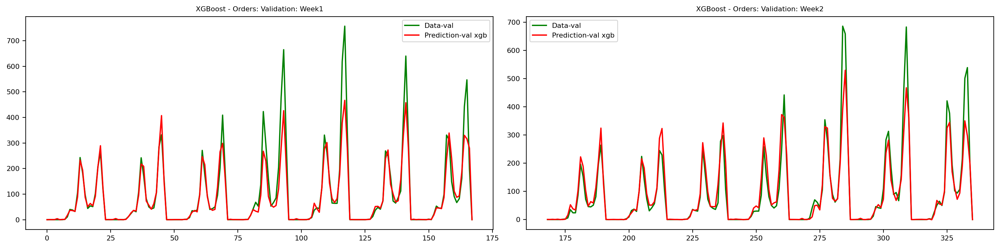

In [33]:
#XGBoost - Orders: one week prediction plot - validation

df_val_pred = pd.concat([pd.DataFrame(y_val, columns = ['orders']),pd.DataFrame(y_pred_val_xgb, columns = ['predictions'])], axis = 1)
df_val_pred.reset_index(inplace = True)

df_val_predW1 = df_val_pred[df_val_pred['index']<168]
df_val_predW2 = df_val_pred[df_val_pred['index']>=168]

# Create a figure and a set of subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 4))  # 1 row, 2 columns

# First plot
axes[0].plot(df_val_predW1.index, df_val_predW1['orders'], label='Data-val', color='green')
axes[0].plot(df_val_predW1.index, df_val_predW1['predictions'], label='Prediction-val xgb', color='red')
axes[0].legend()
axes[0].set_title("XGBoost - Orders: Validation: Week1")

# Second plot
axes[1].plot(df_val_predW2.index, df_val_predW2['orders'], label='Data-val', color='green')
axes[1].plot(df_val_predW2.index, df_val_predW2['predictions'], label='Prediction-val xgb', color='red')
axes[1].legend()
axes[1].set_title("XGBoost - Orders: Validation: Week2")

# Adjust the layout so that the plots do not overlap
plt.tight_layout()

# Show the plots
plt.show()

We also looked at incorporating additional features through OneHotEncoding which perforemed better that directly extracting them to the model such as hour, day, month, year, quarter, day of week into our prediction. We also saw that weekends had a higher frequency of orders so we decided to also include that in our prediction model to see if it would aid. When incorporating these features it performed better than the original XGBoost with a mean squared error score of *2009* but overall performed worse than the Lasso model done previously. 

- XGBoost, Re-Train - Orders: Model Build

In [41]:
# Extract additional time-based features (including the weekend feature)
# X_train 
X_train['hour'] = X_train.index.hour
X_train['dayofweek'] = X_train.index.dayofweek
X_train['day'] = X_train.index.day
X_train['quarter'] = X_train.index.quarter
X_train['year'] = X_train.index.year
X_train['month'] = X_train.index.month
X_train['is_weekend'] = X_train.index.dayofweek.isin([5, 6]).astype(int)

# X_val 
X_val['hour'] = X_val.index.hour
X_val['dayofweek'] = X_val.index.dayofweek
X_val['day'] = X_val.index.day
X_val['quarter'] = X_val.index.quarter
X_val['year'] = X_val.index.year
X_val['month'] = X_val.index.month
X_val['is_weekend'] = X_val.index.dayofweek.isin([5, 6]).astype(int)

# X_test
X_test['hour'] = X_test.index.hour
X_test['dayofweek'] = X_test.index.dayofweek
X_test['day'] = X_test.index.day
X_test['quarter'] = X_test.index.quarter
X_test['year'] = X_test.index.year
X_test['month'] = X_test.index.month
X_test['is_weekend'] = X_test.index.dayofweek.isin([5, 6]).astype(int)

In [42]:
# One-hot encode the categorical time features
def one_hot_encode(df, columns):
    return pd.get_dummies(df, columns=columns)

time_features = ['hour', 'dayofweek', 'day', 'quarter', 'year', 'month', 'is_weekend']
X_train = one_hot_encode(X_train, time_features)
X_val = one_hot_encode(X_val, time_features)
X_test = one_hot_encode(X_test, time_features)

# Ensure X_val has the same columns as X_train
X_val = X_val.reindex(columns=X_train.columns, fill_value=0)
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)


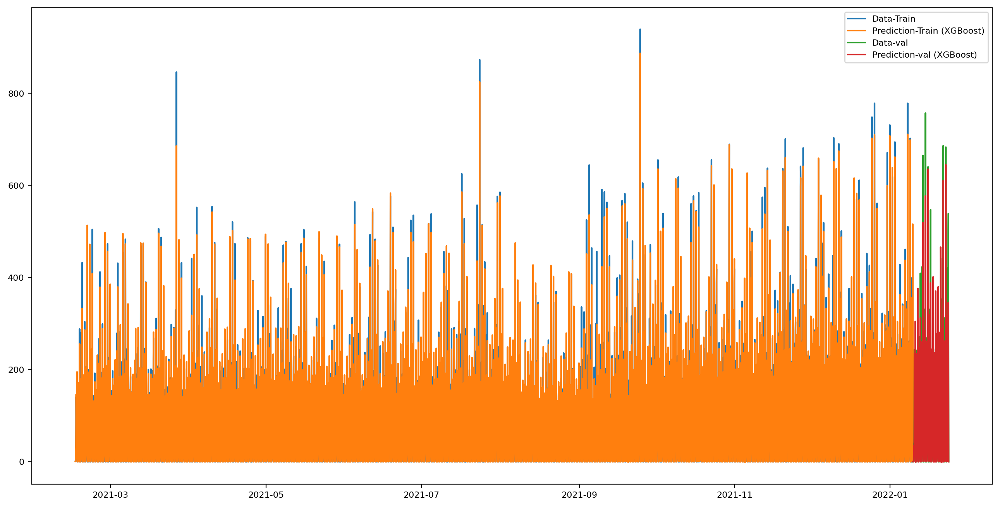

In [58]:
# Train the XGBoost model
params = dict(n_estimators=1000, max_depth=5, learning_rate=0.01, n_jobs=4)
xgb = XGBRegressor(**params)
xgb.fit(X_train, y_train)

# Predict on the validation set
y_pred_val_xgb = xgb.predict(X_val)
y_pred_test_xgb = xgb.predict(X_test)

# Plot for XGBoost
plt.figure(figsize=(16, 8))
plt.plot(t, y_train, label='Data-Train')
plt.plot(t, y_pred_train_xgb, label='Prediction-Train (XGBoost)')
plt.plot(t_val, y_val, label='Data-val')
plt.plot(t_val, y_pred_val_xgb, label='Prediction-val (XGBoost)')
plt.legend()
plt.show()

In [59]:
#XGBoost, Re-Train - Orders: Feature importance

df_features_xgb = pd.DataFrame({
    'feature': X_train.columns,
    'coeff': xgb.feature_importances_
})

df_features_xgb['importance'] = (df_features_xgb['coeff'].abs()/df_features_xgb['coeff'].abs().max()).round(2)
df_features_xgb.sort_values(by = ['importance'], ascending = False, inplace = True)
print('XGBoost, Re-Train - Orders')
print(df_features_xgb.head(15))

XGBoost, Re-Train - Orders
         feature     coeff  importance
144      lag_168  0.183169        1.00
145      lag_336  0.123571        0.67
132  sin(55,168)  0.060205        0.33
126  sin(52,168)  0.014076        0.08
123  cos(50,168)  0.014408        0.08
124  sin(51,168)  0.013918        0.08
41    cos(9,168)  0.015456        0.08
102  sin(40,168)  0.014017        0.08
138  sin(58,168)  0.012231        0.07
81   cos(29,168)  0.011535        0.06
94   sin(36,168)  0.010670        0.06
84   sin(31,168)  0.011467        0.06
130  sin(54,168)  0.008324        0.05
72   sin(25,168)  0.008810        0.05
117  cos(47,168)  0.008375        0.05


- XGBoost, Re-Train - Orders: Performance Metrics - Validation

In [60]:
# Calculate SMAPE
def calculate_smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_pred) + np.abs(y_true)))


# Evaluation Metrics
mse_xgb = mean_squared_error(y_val, y_pred_val_xgb)
mae_xgb = mean_absolute_error(y_val, y_pred_val_xgb)
smape_xgb = calculate_smape(y_val, y_pred_val_xgb)
print(f"MSE (XGBoost): {mse_xgb}")
print(f"MAE (XGBoost): {mae_xgb}")
print(f"SMAPE (XGBoost): {smape_xgb}")

MSE (XGBoost): 1903.8088018061349
MAE (XGBoost): 18.51219845476139
SMAPE (XGBoost): 79.47864490051512


In [61]:
#XGBoost,Re-Train - Orders: performance metrics - validation

df_val_pred_xgb = pd.concat([pd.DataFrame(y_val, columns = ['orders']),pd.DataFrame(y_pred_val_xgb, columns = ['predictions'])], axis = 1)
df_val_pred_xgb.reset_index(inplace = True)
df_val_pred_xgb = df_val_pred_xgb[df_val_pred_xgb['index']<168]

print("XGBoost,Re-Train - Orders: Validation W1:")
mae = mean_absolute_error(df_val_pred_xgb['orders'], df_val_pred_xgb['predictions'])
print("Mean Absolute Error (MAE):", mae)
mse = mean_squared_error(df_val_pred_xgb['orders'], df_val_pred_xgb['predictions'])
print("Mean Squared Error (MSE):", mse)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
r2 = r2_score(df_val_pred_xgb['orders'], df_val_pred_xgb['predictions'])
print("R-squared (R²):", r2)

#subset to only predict a week out
df_val_pred_xgb = pd.concat([pd.DataFrame(y_val, columns = ['orders']),pd.DataFrame(y_pred_val_xgb, columns = ['predictions'])], axis = 1)
df_val_pred_xgb.reset_index(inplace = True)
df_val_pred_xgb = df_val_pred_xgb[df_val_pred_xgb['index']>=168]

print(" ")
print("XGBoost,Re-Train - Orders: Validation W2:")
mae = mean_absolute_error(df_val_pred_xgb['orders'], df_val_pred_xgb['predictions'])
print("Mean Absolute Error (MAE):", mae)
mse = mean_squared_error(df_val_pred_xgb['orders'], df_val_pred_xgb['predictions'])
print("Mean Squared Error (MSE):", mse)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
r2 = r2_score(df_val_pred_xgb['orders'], df_val_pred_xgb['predictions'])
print("R-squared (R²):", r2)

XGBoost,Re-Train - Orders: Validation W1:
Mean Absolute Error (MAE): 16.639729988406458
Mean Squared Error (MSE): 1471.8821654794035
Root Mean Squared Error (RMSE): 38.365116518517226
R-squared (R²): 0.9303769339763884
 
XGBoost,Re-Train - Orders: Validation W2:
Mean Absolute Error (MAE): 20.384666921116324
Mean Squared Error (MSE): 2335.735438132866
Root Mean Squared Error (RMSE): 48.32944690489294
R-squared (R²): 0.87567470099378


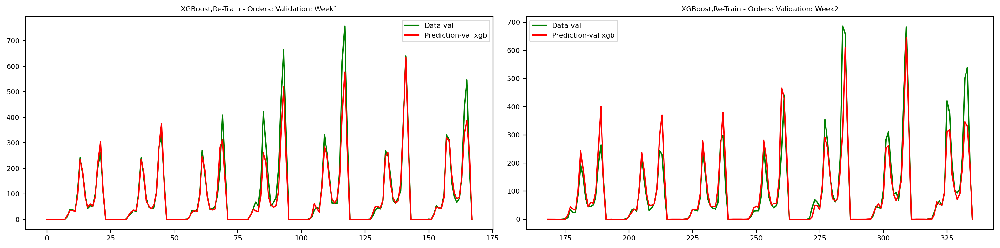

In [62]:
#XGBoost,Re-Train - Orders: one week prediction plot - validation

df_val_pred = pd.concat([pd.DataFrame(y_val, columns = ['orders']),pd.DataFrame(y_pred_val_xgb, columns = ['predictions'])], axis = 1)
df_val_pred.reset_index(inplace = True)

df_val_predW1 = df_val_pred[df_val_pred['index']<168]
df_val_predW2 = df_val_pred[df_val_pred['index']>=168]

# Create a figure and a set of subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 4))  # 1 row, 2 columns

# First plot
axes[0].plot(df_val_predW1.index, df_val_predW1['orders'], label='Data-val', color='green')
axes[0].plot(df_val_predW1.index, df_val_predW1['predictions'], label='Prediction-val xgb', color='red')
axes[0].legend()
axes[0].set_title("XGBoost,Re-Train - Orders: Validation: Week1")

# Second plot
axes[1].plot(df_val_predW2.index, df_val_predW2['orders'], label='Data-val', color='green')
axes[1].plot(df_val_predW2.index, df_val_predW2['predictions'], label='Prediction-val xgb', color='red')
axes[1].legend()
axes[1].set_title("XGBoost,Re-Train - Orders: Validation: Week2")

# Adjust the layout so that the plots do not overlap
plt.tight_layout()

# Show the plots
plt.show()

- XGBoost,Re-Train - Orders: Performance Metrics - Test

In [63]:
#XGBoost,Re-Train - Orders: performance metrics - MAE, MSE, RMSE, R-sqrd - test

#subset to only predict a week out
df_test_pred = pd.concat([pd.DataFrame(y_test, columns = ['orders']),pd.DataFrame(y_pred_test_xgb, columns = ['predictions'])], axis = 1)
df_test_pred.reset_index(inplace = True)

print("XGBoost,Re-Train - Orders: Test:")
mae = mean_absolute_error(df_test_pred['orders'], df_test_pred['predictions'])
print("Mean Absolute Error (MAE):", mae)
mse = mean_squared_error(df_test_pred['orders'], df_test_pred['predictions'])
print("Mean Squared Error (MSE):", mse)
mse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
r2 = r2_score(df_test_pred['orders'], df_test_pred['predictions'])
print("R-squared (R²):", r2)

XGBoost,Re-Train - Orders: Test:
Mean Absolute Error (MAE): 15.411300218442367
Mean Squared Error (MSE): 1253.2974418140318
Root Mean Squared Error (RMSE): 48.32944690489294
R-squared (R²): 0.92561236326246


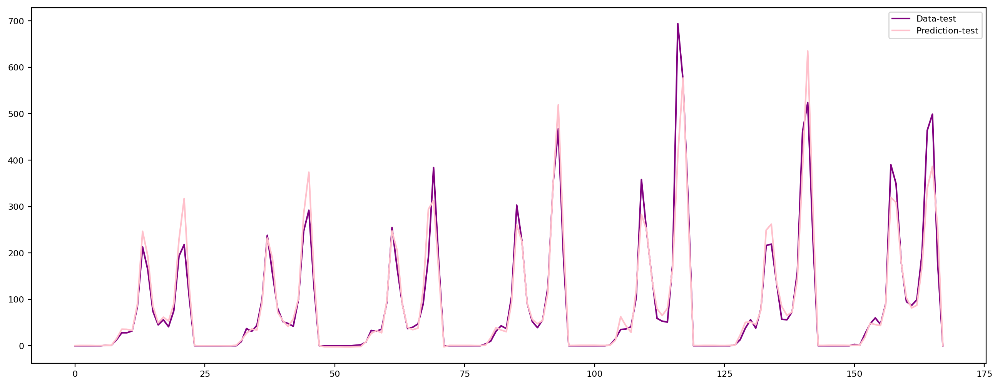

In [64]:
#XGBoost,Re-Train - Orders: one week prediction plot - test

plt.figure(figsize=(16, 6))
plt.plot(df_test_pred.index, df_test_pred['orders'], label='Data-test', color = 'purple')
plt.plot(df_test_pred.index, df_test_pred['predictions'], label='Prediction-test', color = 'pink')
plt.legend()
plt.show()


## ARIMA/SARIMA


Based on performed tests, we would choose the following orders for ARIMA/SARIMA (p, d, q)(P, D, Q, m):

+ based on autocorrelation orders: non-sesonal p = 2, seasonal P = 2
+ based on partial autocorrelation orders: non-seasonal q = 3, seasonal Q = 1
+ based on trend exploratory analysis: d = 0
+ we chose seasonal period of 168 (24*7) for test and seasonalal period of 336 for validation

Note, that due to the limited computing capacity, we could run SARIMA in one notebook only once and only with the following orders: (1, 0, 1)(1, 0, 1, 168) for test.

As expected, ARIMA model, which doesn't capture seasonality of any sort performes poorly and predicts just mean orders. On the contrary, SARIMA model performs relatively well and we were able to get predictions with MSE of 913 and R^2 of 95%. We tried to use log (orders + 1) as our target and found worse prediction performance.

- We import in the data fresh for the ARIMA and SARIMA analysis

In [20]:
orders_df = pd.read_csv(path_in_ + 'data_BCN.csv', dtype = str)
orders_df['time'] = pd.to_datetime(orders_df['time'])
orders_df['orders'] = pd.to_numeric(orders_df['orders'])

orders_df.sort_values(by = ['time'], inplace = True)
orders_df.reset_index(drop = True, inplace = True)

#test is the last week of January
#1/24/2022--1/30/2022 (Mon--Sun)
test_df = orders_df[orders_df['time']>=pd.to_datetime('2022-01-24 00:00:00')].copy()
test_df = test_df[test_df['time']<=pd.to_datetime('2022-01-30 23:00:00')]

#validation is the second and third week of January
#W1: 1/10/2022--1/16/2022 (Mon--Sun)
#W2: 1/17/2022--1/23/2022 (Mon--Sun)
val_df = orders_df[orders_df['time']>=pd.to_datetime('2022-01-10 00:00:00')].copy()
val_df = val_df[val_df['time']<=pd.to_datetime('2022-01-23 23:00:00')]
#created week_ind that specifies the dataset two weeks
val_df['week_ind'] = 1
val_df.loc[(val_df['time']>=pd.to_datetime('2022-01-17 00:00:00')), 'week_ind'] = 2

#the data for training is all other dates
train_df = orders_df[orders_df['time']<=pd.to_datetime('2022-01-09 23:00:00')]


In [21]:
# Display the shapes to verify the splits
print(f'Train set size: {train_df.shape}')
print(f'Validation set size: {val_df.shape}')
print(f'Test set size: {test_df.shape}')

Train set size: (8214, 3)
Validation set size: (336, 4)
Test set size: (168, 3)


In [22]:
train_df.set_index('time', inplace=True)
train_df.index = pd.to_datetime(train_df.index) 
print(train_df.index.min(), train_df.index.max())

val_df.set_index('time', inplace=True)
val_df.index = pd.to_datetime(val_df.index) 
print(val_df.index.min(), val_df.index.max())

test_df.set_index('time', inplace=True)
test_df.index = pd.to_datetime(test_df.index) 
print(test_df.index.min(), test_df.index.max())

2021-02-01 00:00:00 2022-01-09 23:00:00
2022-01-10 00:00:00 2022-01-23 23:00:00
2022-01-24 00:00:00 2022-01-30 23:00:00


- Account for the cycle in August by imputing hourly data in August with the hourly mean values calculated from all the months in the training data.

In [23]:
train_df['month'] = train_df.index.month
train_df['hour'] = train_df.index.hour
# Calculate the mean of 'orders_winsorized' for every hour, excluding data for month=8
mean_hourly_data = train_df[train_df['month'] != 8].groupby('hour')['orders'].mean()

# Replace hourly data for month=8 with mean hourly values
train_df.loc[train_df['month'] == 8, 'orders'] = train_df[train_df['month'] == 8].apply(
    lambda row: mean_hourly_data[row['hour']], axis=1
)

# Add back the rows with month=8 to the DataFrame
train_df = pd.concat([train_df[train_df['month'] != 8], train_df[train_df['month'] == 8]])

# Sort the DataFrame back to its original order
train_df = train_df.sort_index()

/tmp/ipykernel_50257/3188182007.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['month'] = train_df.index.month
/tmp/ipykernel_50257/3188182007.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['hour'] = train_df.index.hour


- ARIMA: Model build

In [24]:
#Arima - Orders: model build

order = (2, 0, 3)

# Fit an ARIMA model on the training data
model_arima = ARIMA(train_df['orders'], order=order)
model_fit_arima = model_arima.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


- ARIMA: Performance Metrics - Validation

In [25]:
#Arima - Orders: predictions - validation

start_date = val_df.index.min()
end_date = val_df.index.max()
pred = model_fit_arima.predict(start=len(train_df), end=len(train_df)+len(val_df)-1, typ='levels')


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


In [26]:
#Arima - Orders: performance metrics - validation

# Evaluate model performance on the testing data
mse = mean_squared_error(val_df['orders'], pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(val_df['orders'], pred)
r2 = r2_score(val_df['orders'], pred)

# Create a dictionary to store the results
result = {
    'model_name': f"ARIMA_{order[0]}{order[1]}{order[2]}",
    'predictions': pred,
    'mse': mse,
    'rmse': rmse,
    'mae': mae,
    'r2': r2
}

# Print the evaluation metrics
print(f"ARIMA({order[0]}, {order[1]}, {order[2]})")
print("MSE:", mse)
print("RMSE:", rmse)
print("MAE:", mae)
print("R-squared:", r2)
print()

ARIMA(2, 0, 3)
MSE: 20313.809916322247
RMSE: 142.5265235537661
MAE: 92.56272669390867
R-squared: -0.016960673806502458



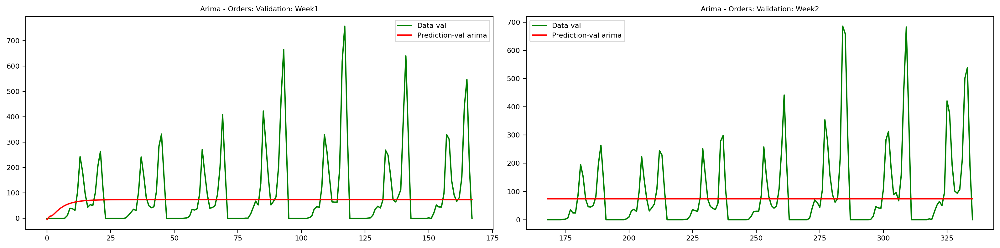

In [27]:
#Arima - Orders: one week prediction plot - validation

df_y_val_arima = pd.DataFrame(y_val, columns = ['orders'])
df_y_pred_arima = pd.DataFrame(np.array(pred), columns = ['predictions'])
df_y_val_arima.reset_index(drop = True, inplace = True)
df_y_pred_arima.reset_index(drop = True, inplace = True)

df_val_pred = pd.concat([df_y_val_arima, df_y_pred_arima], axis = 1)
df_val_pred.reset_index(inplace = True)

df_val_predW1 = df_val_pred[df_val_pred['index']<168]
df_val_predW2 = df_val_pred[df_val_pred['index']>=168]

# Create a figure and a set of subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 4))  # 1 row, 2 columns

# First plot
axes[0].plot(df_val_predW1.index, df_val_predW1['orders'], label='Data-val', color='green')
axes[0].plot(df_val_predW1.index, df_val_predW1['predictions'], label='Prediction-val arima', color='red')
axes[0].legend()
axes[0].set_title("Arima - Orders: Validation: Week1")

# Second plot
axes[1].plot(df_val_predW2.index, df_val_predW2['orders'], label='Data-val', color='green')
axes[1].plot(df_val_predW2.index, df_val_predW2['predictions'], label='Prediction-val arima', color='red')
axes[1].legend()
axes[1].set_title("Arima - Orders: Validation: Week2")

# Adjust the layout so that the plots do not overlap
plt.tight_layout()

# Show the plots
plt.show()

- SARIMA: Model Build

In [28]:
#Sarima - Orders: model build

# Define the SARIMAX order to use
sarimax_order = ((1, 0, 1), (1, 0, 1, 168))

# Fit a SARIMAX model on the training data
model_final = SARIMAX(train_df['orders'], order=sarimax_order[0], seasonal_order=sarimax_order[1])
model_final = model_final.fit()


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.36108D+00    |proj g|=  8.88766D-02

At iterate    5    f=  5.31105D+00    |proj g|=  2.11075D-02

At iterate   10    f=  5.18870D+00    |proj g|=  1.09574D-01

At iterate   15    f=  5.03098D+00    |proj g|=  2.10790D-02

At iterate   20    f=  5.03004D+00    |proj g|=  2.11778D-03

At iterate   25    f=  5.03003D+00    |proj g|=  4.79581D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     32      1     0     0   

: 

In [ ]:
#Sarima - Orders: predictions

start_test = len(train_df)
end_test = start_test + len(val_df) + len(test_df) - 1
pred_sarima = model_final.predict(start=start_test, end=end_test, typ='levels')

df_y_arima = pd.concat([pd.DataFrame(y_val, columns = ['orders']), pd.DataFrame(y_test, columns = ['orders'])], ignore_index = True)
df_y_pred_arima = pd.DataFrame(np.array(pred_sarima), columns = ['predictions'])
df_y_val_arima.reset_index(drop = True, inplace = True)
df_y_pred_arima.reset_index(drop = True, inplace = True)

df_val_pred = pd.concat([df_y_arima, df_y_pred_arima], axis = 1)
df_val_pred.reset_index(inplace = True)

df_val_predW1 = df_val_pred[df_val_pred['index']<168]
df_val_predW2 = df_val_pred[df_val_pred['index']>=168]
df_val_predW2 = df_val_predW2[df_val_predW2['index']<336]
df_test_predW1 = df_val_pred[df_val_pred['index']>=336]


- SARIMA: Performance Metrics - Validation

In [ ]:
#Sarima - Orders: performance metrics - validation

# Evaluate model performance on the testing data
mse = mean_squared_error(df_val_predW1['orders'], df_val_predW1['prediction'])
rmse = np.sqrt(mse)
mae = mean_absolute_error(df_val_predW1['orders'], df_val_predW1['prediction'])
r2 = r2_score(df_val_predW1['orders'], df_val_predW1['prediction'])

# Create a dictionary to store the results
result = {
    'model_name': f"SARIMA_{order[0]}{order[1]}{order[2]}",
    'predictions': pred,
    'mse': mse,
    'rmse': rmse,
    'mae': mae,
    'r2': r2
}

print("SARIMA: Validation - Week1")
# Print the evaluation metrics
print(f"SARIMA({order[0]}, {order[1]}, {order[2]})")
print("MSE:", mse)
print("RMSE:", rmse)
print("MAE:", mae)
print("R-squared:", r2)
print()

# Evaluate model performance on the testing data
mse = mean_squared_error(df_val_predW2['orders'], df_val_predW2['prediction'])
rmse = np.sqrt(mse)
mae = mean_absolute_error(df_val_predW2['orders'], df_val_predW2['prediction'])
r2 = r2_score(df_val_predW2['orders'], df_val_predW2['prediction'])

# Create a dictionary to store the results
result = {
    'model_name': f"SARIMA_{order[0]}{order[1]}{order[2]}",
    'predictions': pred,
    'mse': mse,
    'rmse': rmse,
    'mae': mae,
    'r2': r2
}

print(" ")
print("SARIMA: Validation - Week2")
# Print the evaluation metrics
print(f"SARIMA({order[0]}, {order[1]}, {order[2]})")
print("MSE:", mse)
print("RMSE:", rmse)
print("MAE:", mae)
print("R-squared:", r2)
print()

In [ ]:
# Create a figure and a set of subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 4))  # 1 row, 2 columns

# First plot
axes[0].plot(df_val_predW1.index, df_val_predW1['orders'], label='Data-val', color='green')
axes[0].plot(df_val_predW1.index, df_val_predW1['predictions'], label='Prediction-val arima', color='red')
axes[0].legend()
axes[0].set_title("Arima - Orders: Validation: Week1")

# Second plot
axes[1].plot(df_val_predW2.index, df_val_predW2['orders'], label='Data-val', color='green')
axes[1].plot(df_val_predW2.index, df_val_predW2['predictions'], label='Prediction-val arima', color='red')
axes[1].legend()
axes[1].set_title("Arima - Orders: Validation: Week2")

# Adjust the layout so that the plots do not overlap
plt.tight_layout()

# Show the plots
plt.show()

- SARIMA: Performance Metrics - Test

In [ ]:
# Evaluate model performance on the testing data
mse = mean_squared_error(df_test_predW1['orders'], df_test_predW1['prediction'])
rmse = np.sqrt(mse)
mae = mean_absolute_error(df_test_predW1['orders'], df_test_predW1['prediction'])
r2 = r2_score(df_test_predW1['orders'], df_test_predW1['prediction'])

# Create a dictionary to store the results
result = {
    'model_name': f"SARIMA_{order[0]}{order[1]}{order[2]}",
    'predictions': pred,
    'mse': mse,
    'rmse': rmse,
    'mae': mae,
    'r2': r2
}

print("SARIMA: Test")
# Print the evaluation metrics
print(f"SARIMA({order[0]}, {order[1]}, {order[2]})")
print("MSE:", mse)
print("RMSE:", rmse)
print("MAE:", mae)
print("R-squared:", r2)
print()

In [ ]:
plt.figure(figsize=(16, 6))
plt.plot(df_test_predW1.index, df_test_predW1['orders'], label='Data-test sarima', color = 'purple')
plt.plot(df_test_predW1.index, df_test_predW1['predictions'], label='Prediction-test sarima', color = 'pink')
plt.legend()
plt.show()